# **Project Name**    - Bike Sharing Demand Prediction



##### **Project Type**    - Regression
##### **Contribution**    - Individual
##### **Member name**    - Abhishek pandey


# **Project Summary -**

Bike demand prediction is a common problem faced by bike rental companies, as accurately forecasting the demand for bikes can help optimize inventory and pricing strategies. In this project, I aim to develop a regression supervised machine learning model to predict the demand for bikes in a given time period.

Originally dataset of bike rental information from a bike sharing company, had information including details on the number of bikes rented, the time and date of the rental, and various weather and seasonality features, information on other relevant factors that could impact bike demand, such as holidays, functioning or non functioning day.

After preprocessing and cleaning the data, I split it into training and test sets and used the training data to train our machine learning model. I experimented with several different model architectures and hyperparameter settings, ultimately selecting the model that performed the best on the test data.

To evaluate the performance of our model, I used a variety of metrics, including mean absolute error, root mean squared error, and R-squared. I found that our model was able to make highly accurate predictions.

In addition to evaluating the performance of our model on the test data, I also conducted a series of studies to understand the impact of individual features on the model's performance. I found that the temperature, as well as the weather and seasonality features, had the greatest impact on bike demand.

# **GitHub Link -**

https://github.com/abhipan26/Bike_demand

# **Problem Statement**


Currently Rental bikes are introduced in many urban cities. The business problem is to ensure a stable supply of rental bikes in urban cities by predicting the demand for bikes at each hour. By providing a stable supply of rental bikes, the system can enhance mobility comfort for the public and reduce waiting time, leading to greater customer satisfaction.

To address this problem, i need to develop a predictive model that takes into account various factors that may influence demand, such as time of day, seasonality, weather conditions, and holidays. By accurately predicting demand, the bike sharing system operators can ensure that there is an adequate supply of bikes available at all times, which can improve the user experience and increase usage of the bike sharing system. This can have a positive impact on the sustainability of urban transportation, as it can reduce congestion, air pollution, and greenhouse gas emissions.

# **General Guidelines** : -

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.

     The additional credits will have advantages over other students during Star Student selection.

             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.


```
# Chart visualization code
```


*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [6]:
# Import Libraries
import pandas as pd
import numpy as np
from datetime import datetime as dt


# Import Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Import warnings
import warnings
warnings.filterwarnings('ignore')

# Import preporcessing libraries
from sklearn.preprocessing import MinMaxScaler,StandardScaler

# Import model selection libraries
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV

# Import Outlier influence library
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Import Model
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from xgboost import XGBRegressor
import xgboost as xgb

# Import evaluation metric libraries
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

# Import tree for visualization
from sklearn.tree import export_graphviz
from sklearn import tree
from IPython.display import SVG,display
from graphviz import Source

### Dataset Loading

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
# Load Dataset from google drive
bike = pd.read_csv("/content/drive/MyDrive/dataset/SeoulBikeData.csv", encoding="unicode_escape")

### Dataset First View

In [10]:
# Dataset First Look
# View top 5 rows of the dataset
bike.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


### Dataset Rows & Columns count

In [11]:
# Dataset Rows & Columns count
# Checking number of rows and columns of the dataset using shape
print("Number of rows are: ",bike.shape[0])
print("Number of columns are: ",bike.shape[1])

Number of rows are:  8760
Number of columns are:  14


### Dataset Information

In [12]:
# Dataset Info
# Checking information about the dataset using info
bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

#### Duplicate Values

In [13]:
# Checking Dataset Duplicate Value Count
bike.duplicated().sum()

0

#### Missing Values/Null Values

In [14]:
# Checking Missing Values/Null Values Count
bike.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

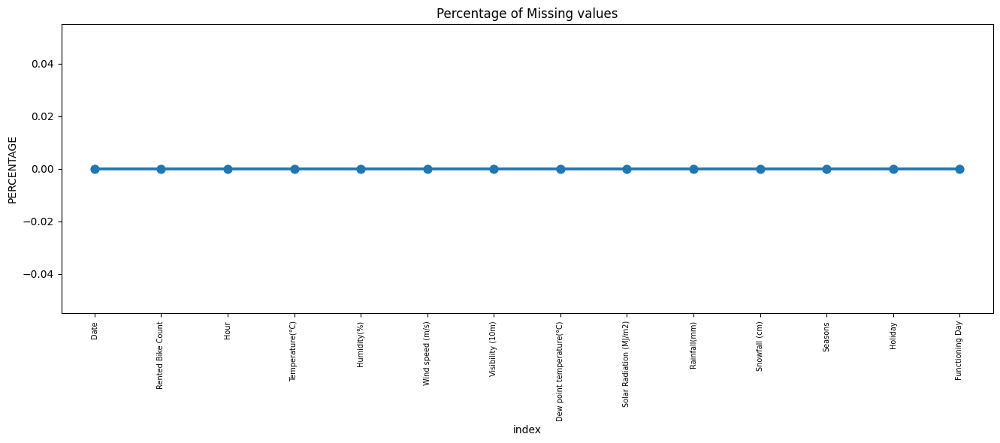

In [15]:
# Visualizing the missing values
missing = pd.DataFrame((bike.isnull().sum())*100/bike.shape[0]).reset_index()
plt.figure(figsize=(16,5))
ax = sns.pointplot(x='index', y=0, data=missing)
plt.xticks(rotation=90, fontsize=7)
plt.title("Percentage of Missing values")
plt.ylabel("PERCENTAGE")
plt.show()

### What did you know about your dataset?

The Seoul Bike Sharing Demand dataset contains information about bike rental in Seoul from 2017-2018. It includes hourly observations of 14 columns, such as the date, time, number of rented bikes, weather conditions, and other factors that may influence bike rental demand.

This dataset contains 8760 rows and 14 columns of the data.

There are no duplicate rows in the dataset.

Also there are no missing values or Null values in the dataset.

## ***2. Understanding Your Variables***

In [16]:
# Dataset Columns
bike.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [17]:
# Dataset Describe (all columns included)
bike.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


### Variables Description



<b>Attribute Information : </b>

*   **Date** : The date of the observation.
*   **Rented Bike Count** : The number of bikes rented during the observation period.
*   **Hour** : The hour of the day when the observation was taken.
*   **Temperature(°C)** : The temperature in Celsius at the time of observation.
*   **Humidity(%)** : The percentage of humidity at the time of observation.
*   **Wind speed (m/s)** : The wind speed in meters per second at the time of observation.
*   **Visibility (10m)** : The visibility in meters at the time of observation.
*   **Dew point temperature(°C)** : The dew point temperature in Celsius at the time of observation.
*   **Solar Radiation (MJ/m2)** : The amount of solar radiation in mega-joules per square meter at the time of observation.
*   **Rainfall(mm)** : The amount of rainfall in millimeters during the observation period.
*   **Snowfall(cm)** : The amount of snowfall in centimeters during the observation period.
*   **Seasons** : The season of the year when the observation was taken.
*   **Holiday** : Whether the observation was taken on a holiday or not.
*   **Functioning Day** : Whether the bike sharing system was operating normally or not during the observation period.

### Check Unique Values for each variable.

In [18]:
# Check Unique Values for each variable using a for loop.
for i in bike.columns.tolist():
  print("No. of unique values in",i,"is",bike[i].nunique())

No. of unique values in Date is 365
No. of unique values in Rented Bike Count is 2166
No. of unique values in Hour is 24
No. of unique values in Temperature(°C) is 546
No. of unique values in Humidity(%) is 90
No. of unique values in Wind speed (m/s) is 65
No. of unique values in Visibility (10m) is 1789
No. of unique values in Dew point temperature(°C) is 556
No. of unique values in Solar Radiation (MJ/m2) is 345
No. of unique values in Rainfall(mm) is 61
No. of unique values in Snowfall (cm) is 51
No. of unique values in Seasons is 4
No. of unique values in Holiday is 2
No. of unique values in Functioning Day is 2


## 3. ***Data Wrangling***

### Data Wrangling Code

In [19]:
# Before doing any data wrangling lets create copy of the dataset
data_2 = bike.copy()

In [20]:
# Renaming the columns
data_2.rename(columns= {'Date':'date','Rented Bike Count': 'rented_bike_count', 'Hour':'hour',
                    'Temperature(°C)':'temperature', 'Humidity(%)':'humidity',
                    'Wind speed (m/s)': 'wind_speed', 'Visibility (10m)': 'visibility',
                    'Dew point temperature(°C)':'dew_point_temp',
                    'Solar Radiation (MJ/m2)': 'solar_radiation', 'Rainfall(mm)': 'rainfall',
                    'Snowfall (cm)':'snowfall', 'Seasons':'seasons',
                    'Holiday':'holiday', 'Functioning Day':'func_day'},
          inplace=True)

In [21]:
# Dataset Columns
data_2.columns

Index(['date', 'rented_bike_count', 'hour', 'temperature', 'humidity',
       'wind_speed', 'visibility', 'dew_point_temp', 'solar_radiation',
       'rainfall', 'snowfall', 'seasons', 'holiday', 'func_day'],
      dtype='object')

In [22]:
# converting date variable into datetime datatype
data_2['date'] = data_2['date'].apply(lambda x: dt.strptime(x,'%d/%m/%Y'))

In [23]:
# Creating new columns for day and month
data_2['month'] = data_2['date'].apply(lambda x : x.month)
data_2['day_of_week'] = data_2['date'].apply(lambda x : x.isoweekday())

In [24]:
# creating 'weekend' from day_of_week
data_2['weekend'] = data_2['day_of_week'].apply(lambda x: 1 if x>5 else 0)

In [25]:
# View top 5 rows of the dataset
data_2.head()

,date,rented_bike_count,hour,temperature,humidity,wind_speed,visibility,dew_point_temp,solar_radiation,rainfall,snowfall,seasons,holiday,func_day,month,day_of_week,weekend
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,5,0
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,5,0
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,12,5,0
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,5,0
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,5,0


In [26]:
# View bottom 5 rows of the dataset
data_2.tail()

,date,rented_bike_count,hour,temperature,humidity,wind_speed,visibility,dew_point_temp,solar_radiation,rainfall,snowfall,seasons,holiday,func_day,month,day_of_week,weekend
8755,2018-11-30,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes,11,5,0
8756,2018-11-30,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes,11,5,0
8757,2018-11-30,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes,11,5,0
8758,2018-11-30,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes,11,5,0
8759,2018-11-30,584,23,1.9,43,1.3,1909,-9.3,0.0,0.0,0.0,Autumn,No Holiday,Yes,11,5,0


In [29]:
# View of 5 random sample
data_2.sample(5)

,date,rented_bike_count,hour,temperature,humidity,wind_speed,visibility,dew_point_temp,solar_radiation,rainfall,snowfall,seasons,holiday,func_day,month,day_of_week,weekend
2141,2018-02-28,62,5,5.2,59,1.7,437,-2.1,0.0,0.0,0.0,Winter,No Holiday,Yes,2,3,0
126,2017-12-06,142,6,-3.7,76,0.0,1864,-7.3,0.0,0.0,0.4,Winter,No Holiday,Yes,12,3,0
7757,2018-10-20,154,5,8.1,76,0.6,1309,4.1,0.0,0.0,0.0,Autumn,No Holiday,Yes,10,6,1
867,2018-01-06,103,3,-5.6,56,1.0,1367,-13.0,0.0,0.0,0.0,Winter,No Holiday,Yes,1,6,1
2519,2018-03-15,343,23,9.3,90,4.1,609,7.7,0.0,0.0,0.0,Spring,No Holiday,Yes,3,4,0


In [30]:
# Describe New Dataset
data_2.describe()

,rented_bike_count,hour,temperature,humidity,wind_speed,visibility,dew_point_temp,solar_radiation,rainfall,snowfall,month,day_of_week,weekend
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,6.526027,4.002740,0.284932
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,3.448048,1.998056,0.451408
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,4.000000,2.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,7.000000,4.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,10.000000,6.000000,1.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000,12.000000,7.000000,1.000000


In [31]:
# defining continuous independent variables separately
cont_var = ['temperature', 'humidity', 'wind_speed', 'visibility', 'dew_point_temp','solar_radiation', 'rainfall', 'snowfall']

In [32]:
# defining dependent variable
dependent_variable = ['rented_bike_count']

In [33]:
# defining categorical independent variables separately
cat_var = ['hour','seasons', 'holiday', 'func_day', 'month', 'day_of_week', 'weekend']

### What all manipulations have you done and insights you found?

1. From the Date column, 'month' and 'day of the week' columns are created.

2. From the 'day of the week' column, 'weekend' column is created and assign the value 1 to weekend days i.e, saturday and sunday and 0 to the rest of the days.

3. Defining the continuous variables, dependent variable and categorical variables for ease of plotting graphs.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1 : Dependent variable Distribution

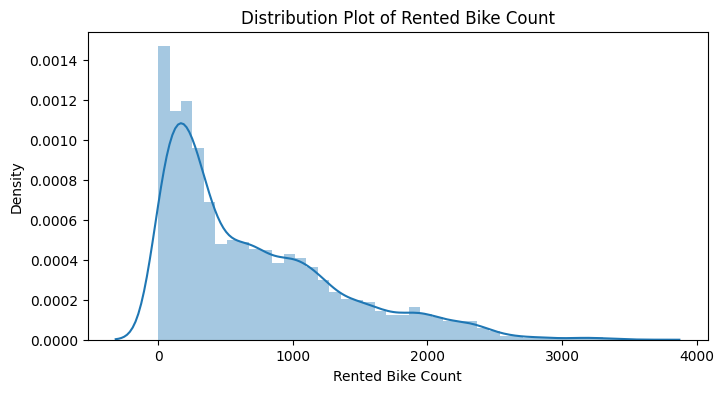

In [34]:
# Chart-1 Visualization code for distribution of target variable
plt.figure(figsize=(8,4))
sns.distplot(data_2['rented_bike_count'])
plt.xlabel("Rented Bike Count")
plt.title('Distribution Plot of Rented Bike Count')
plt.show()

##### 1. Why did you pick the specific chart?

Histogram plot to analyse the variable distributions over the whole dataset whether it's symmetric or not.

##### 2. What is/are the insight(s) found from the chart?

It means that distribution is not symmetric around the the mean.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

#### Chart - 2 : Distribution by Hist/Box plot

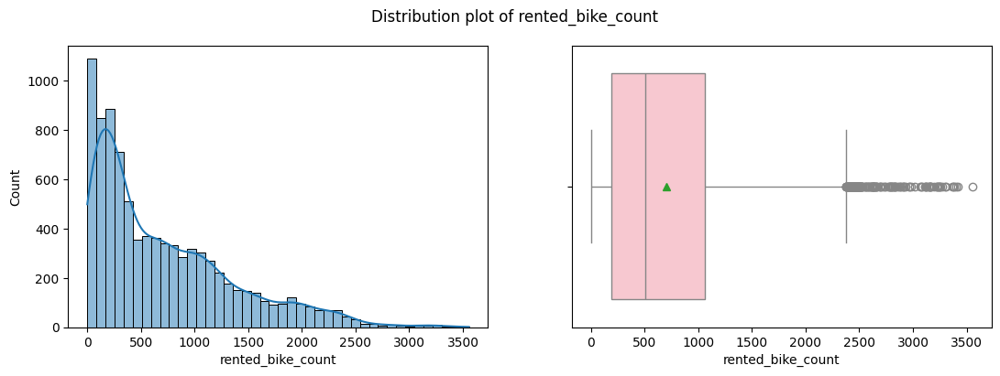

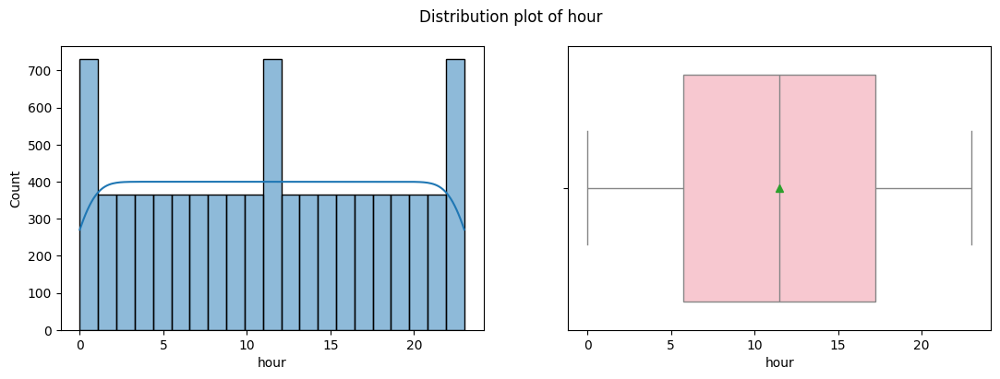

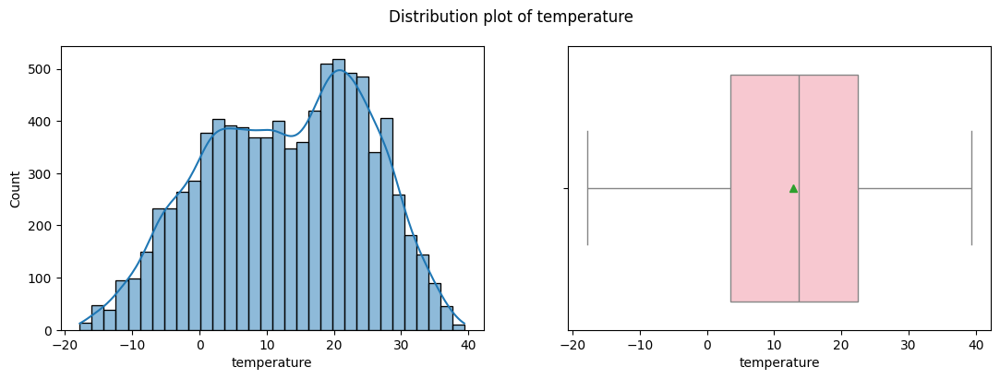

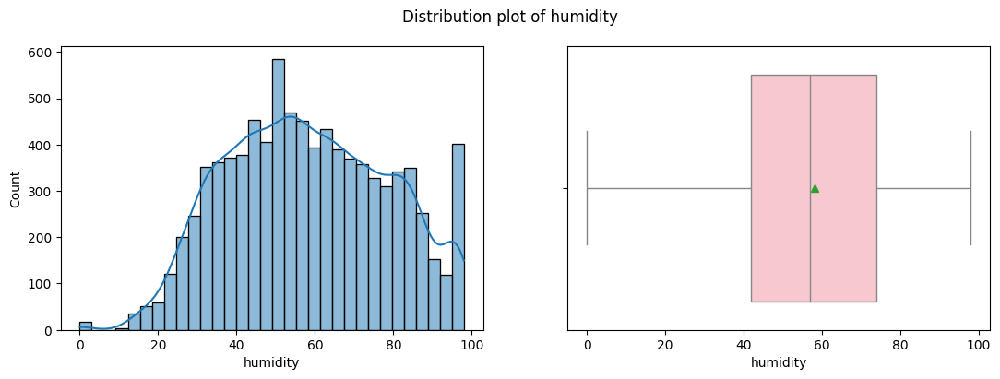

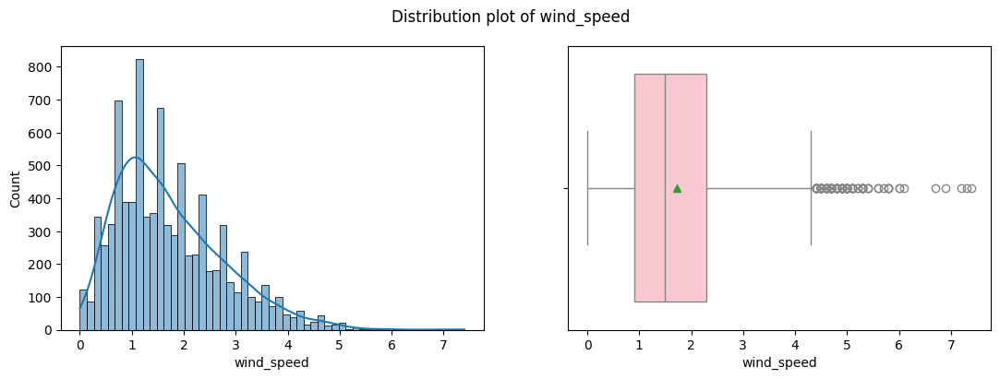

...

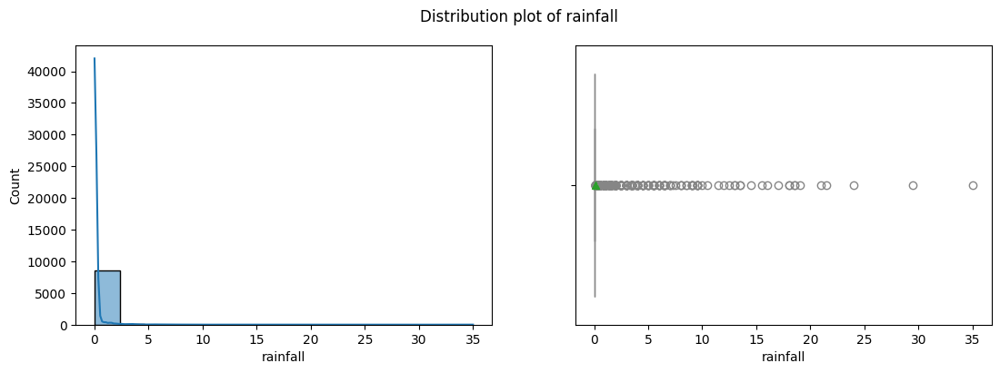

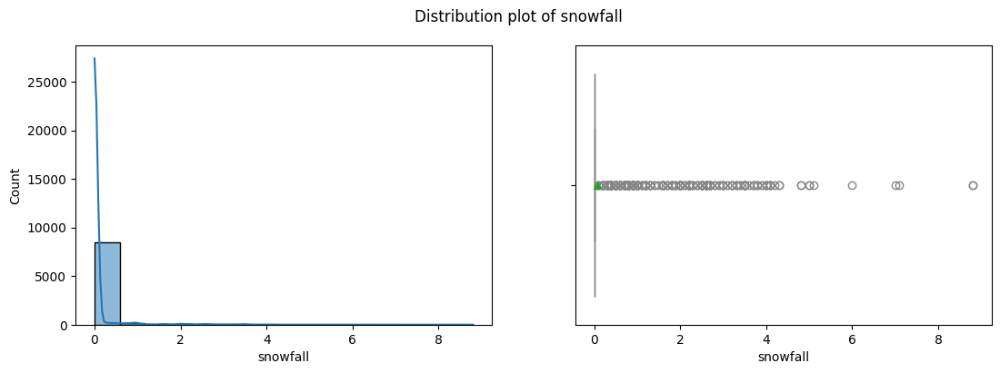

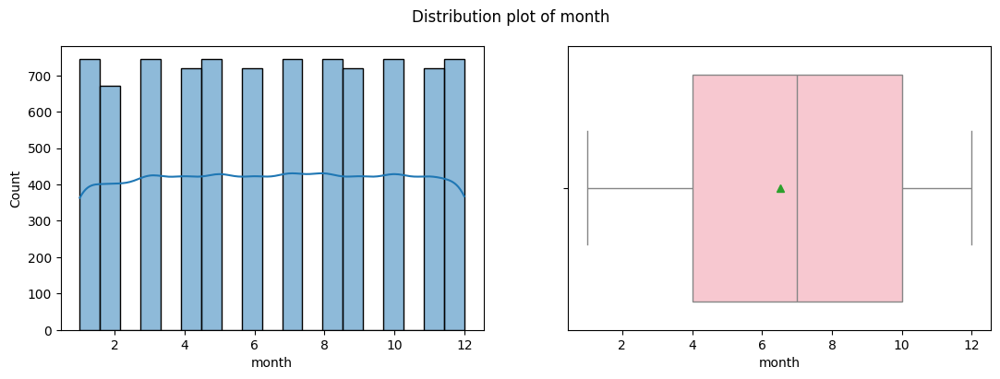

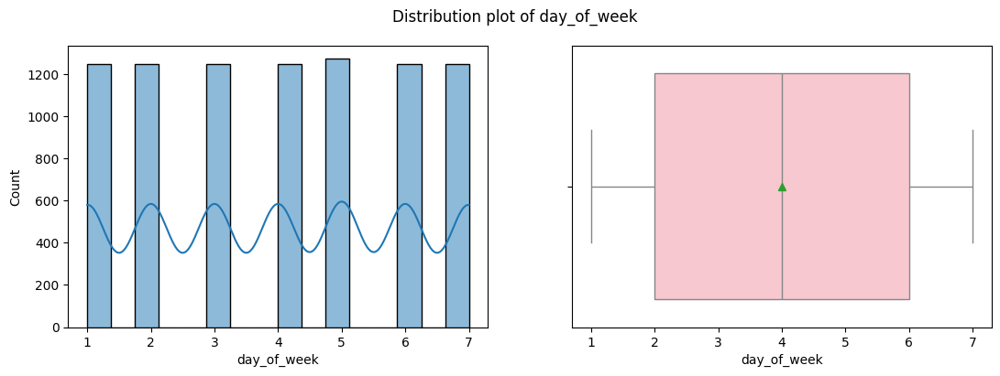

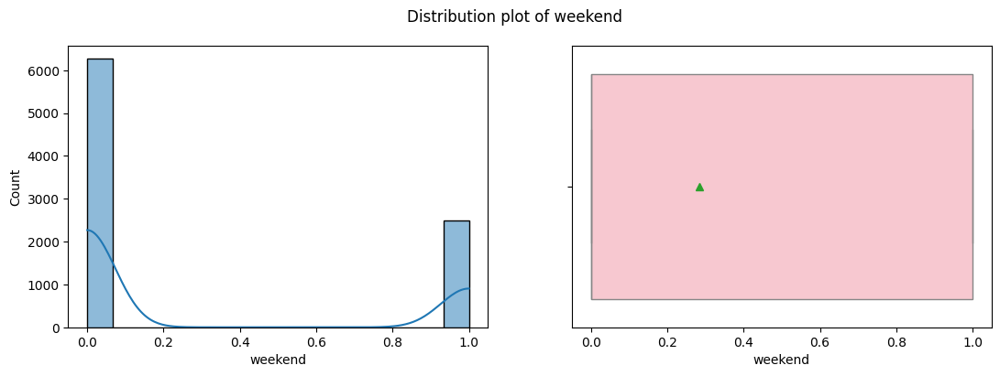

In [35]:
# Visualizing code of histogram plot & boxplot for each columns to know the data distribution
for col in data_2.describe().columns:
    fig,axes = plt.subplots(nrows=1,ncols=2,figsize=(13,4))
    sns.histplot(data_2[col], ax = axes[0],kde = True)
    sns.boxplot(data_2[col], ax = axes[1],orient='h',showmeans=True,color='pink')
    fig.suptitle("Distribution plot of "+ col, fontsize = 12)
    plt.show()

##### 1. Why did you pick the specific chart?

Histogram plot to analysis the variable distributions over the whole dataset whether it's symmetric or not.

Box plot to analyse the outliers and interquartile range including mean, median, maximum and minimum value.

##### 2. What is/are the insight(s) found from the chart?

Temperature and humidity columns are looks normally distributed others shows the different distributions.

Outlier values in snowfall, rainfall, wind speed & solar radiation columns

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Histogram and Box plot cannot give us whole information regarding data.

#### Chart - 3 : Dependent variable with continuous variables

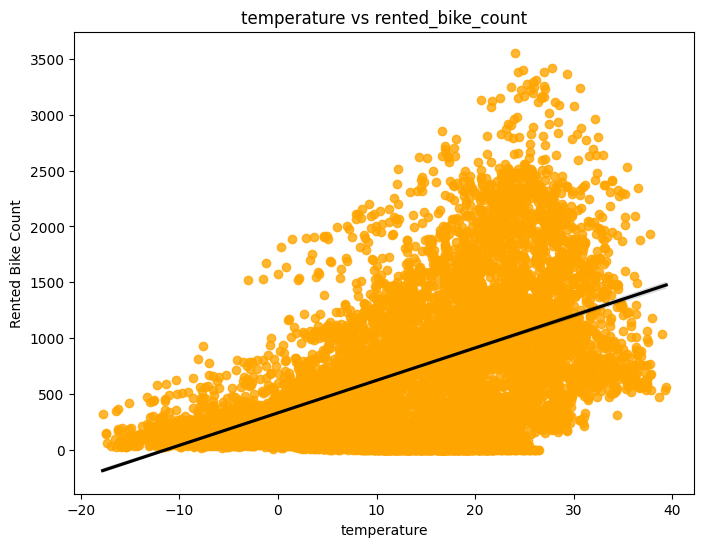

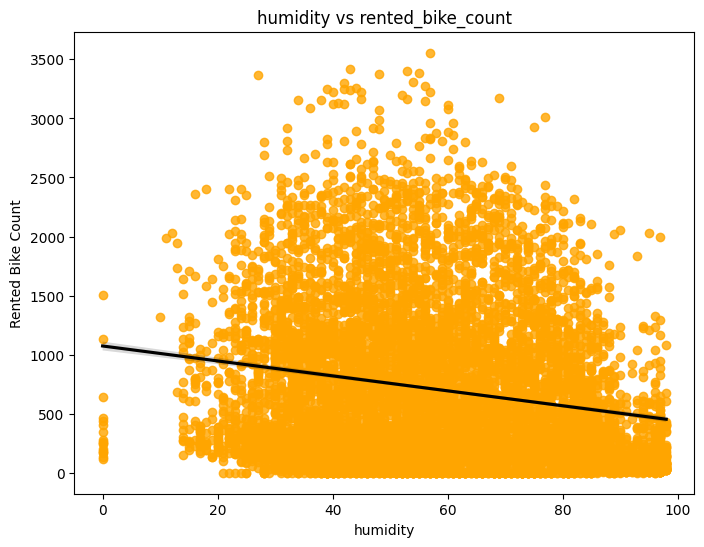

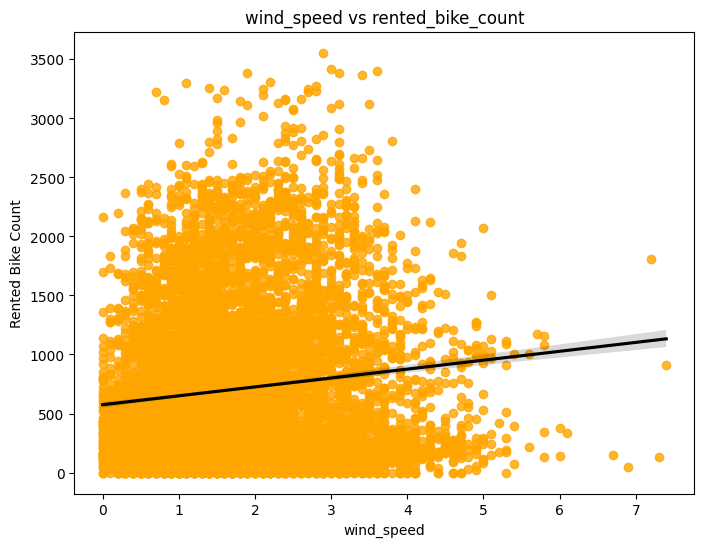

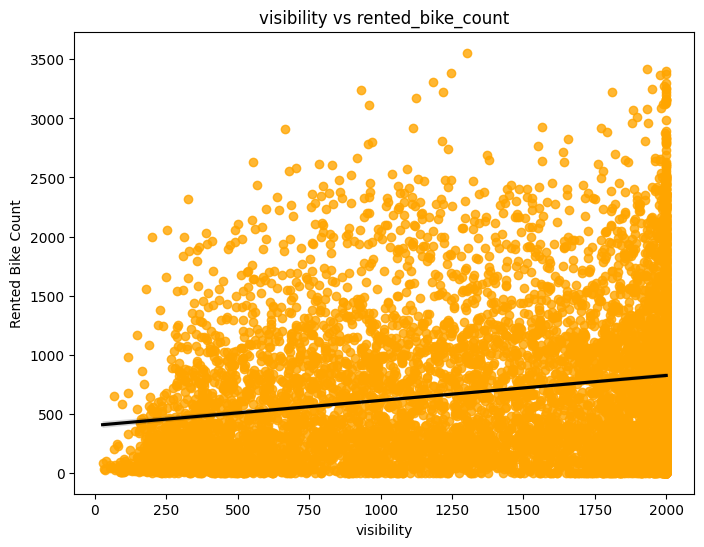

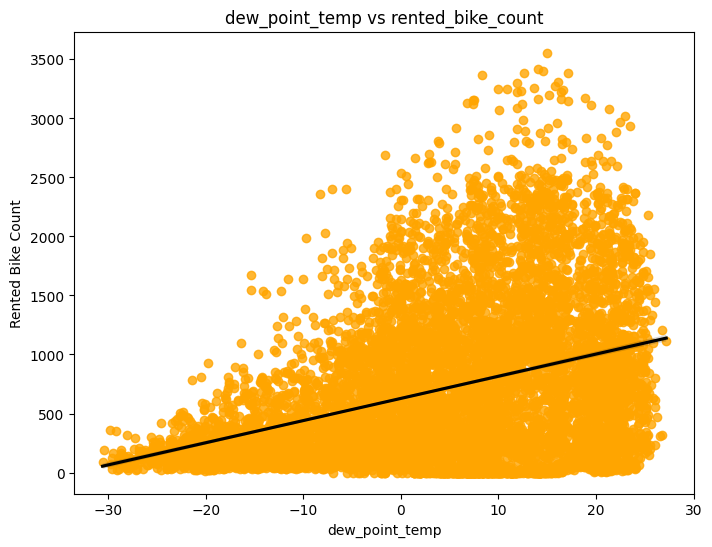

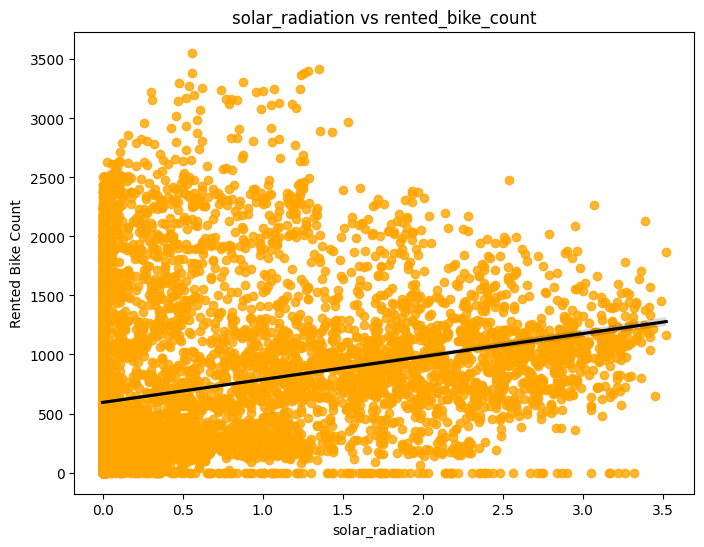

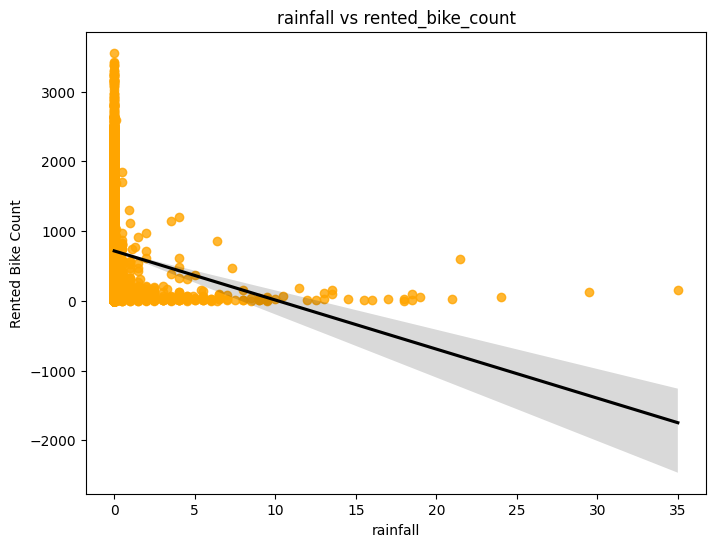

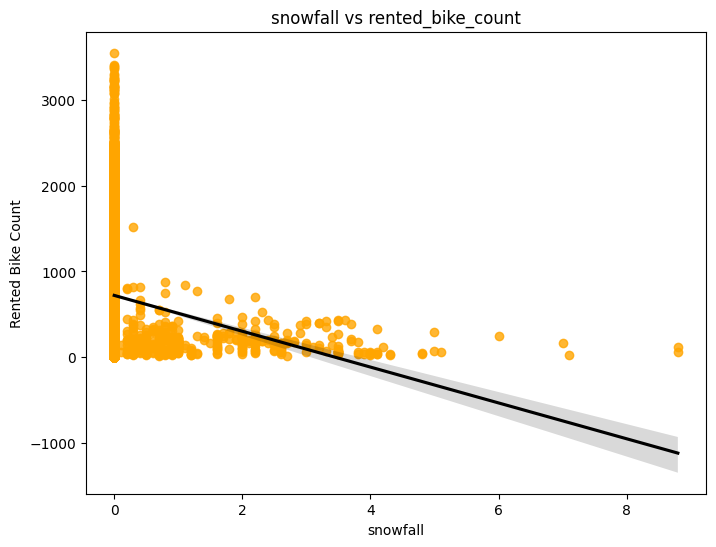

In [36]:
# Analyzing the relationship between the dependent variable and the continuous variables
for i in cont_var:
  plt.figure(figsize=(8,6))
  sns.regplot(x=i,y=dependent_variable[0],data=data_2,scatter_kws={"color": 'orange'}, line_kws={"color": "black"})
  plt.ylabel("Rented Bike Count")
  plt.xlabel(i)
  plt.title(i+' vs '+ dependent_variable[0])
  plt.show()

##### 1. Why did you pick the specific chart?

To check the patterns between independent variable with dependent variable(Rented bike).

##### 2. What is/are the insight(s) found from the chart?

'Rainfall','Snowfall','Humidity' these features are negatively related with the target variable which means the rented bike count decreases when these features increase.

Similarly, 'Temperature','Wind speed','Visibility','dew point','Solar radiation' these features are positively related with the target variable which means the rented bike count increases when these features increase.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

#### Chart - 4 : Categorical variables with dependent variable

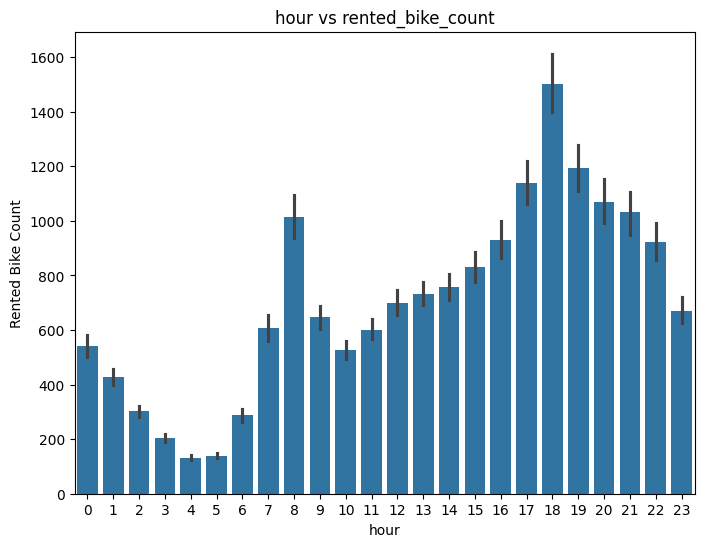

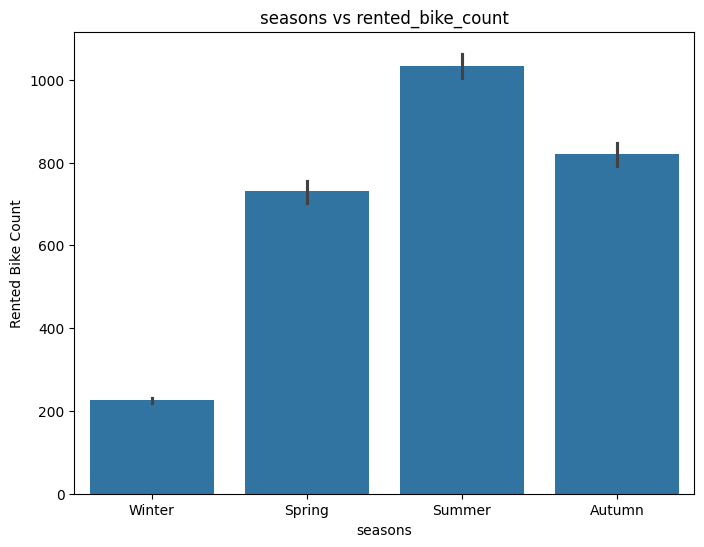

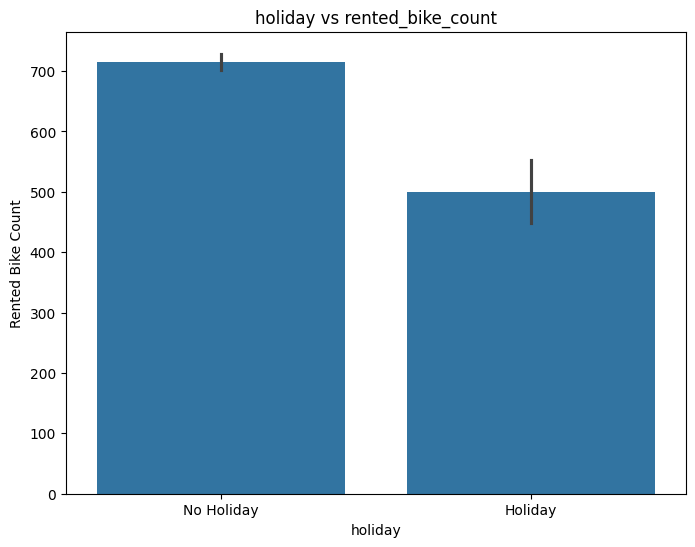

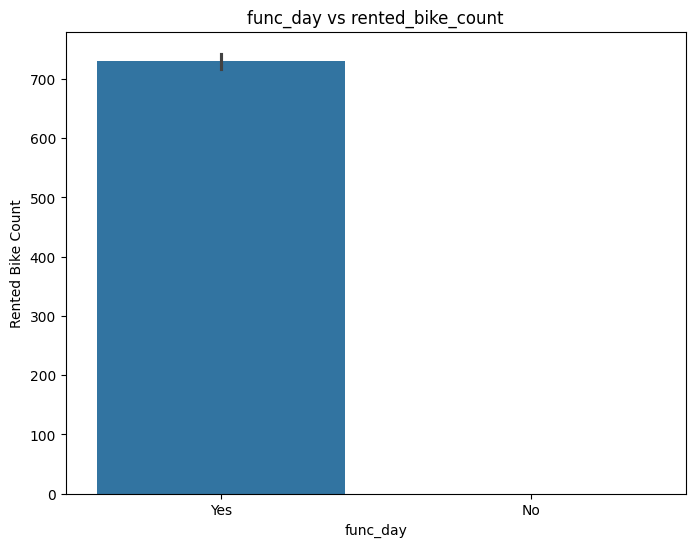

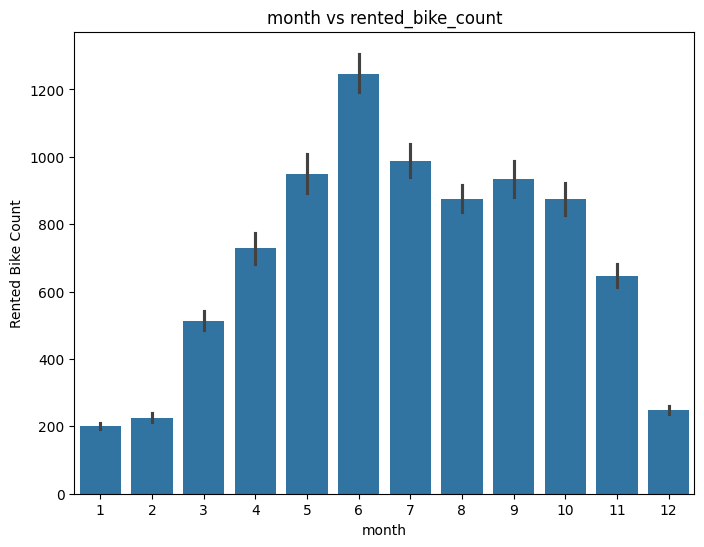

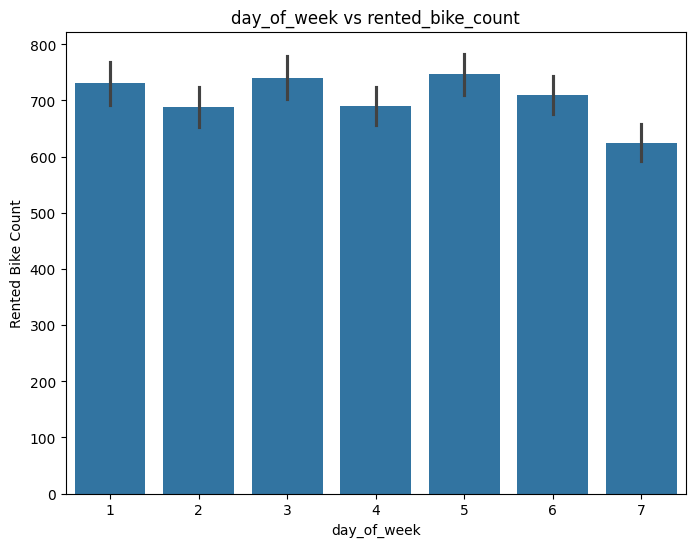

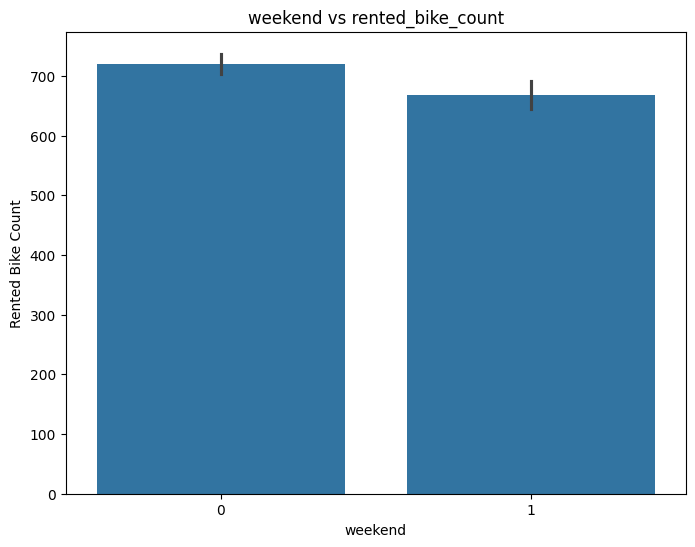

In [37]:
# Analyzing the relationship between the dependent variable and the categorical variables
for i in cat_var:
  plt.figure(figsize=(8,6))
  sns.barplot(x=i,y=dependent_variable[0],data=data_2)
  plt.ylabel("Rented Bike Count")
  plt.xlabel(i)
  plt.title(i+' vs '+ dependent_variable[0])
  plt.show()

##### 1. Why did you pick the specific chart?

To show the distribution of the rented bike count with other categorical variables we used bar charts.

##### 2. What is/are the insight(s) found from the chart?

From above bar plots we see that :

1. Demand according to seasons i.e Summer>Autumn>Spring>Winter .  
In winter season there is no significant demand even in the morning or in the evening but in a summer the demand is higher than rest of the season.
2. On the functional day (i.e No Holiday) there is spike in morning and in evening, but in a holiday the demand goes to 0.
3. Around 3 months in winter season (i.e December, January & February) there is low demand.
4. From the month 5 to 10 (May - October) the demand of the rented bike is high as compare to other months.These months came inside the summer season.

5. Peak Time are 7 am to 9 am and 5 pm to 7 pm

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

#### Chart - 5 : Rented Bike vs Hour

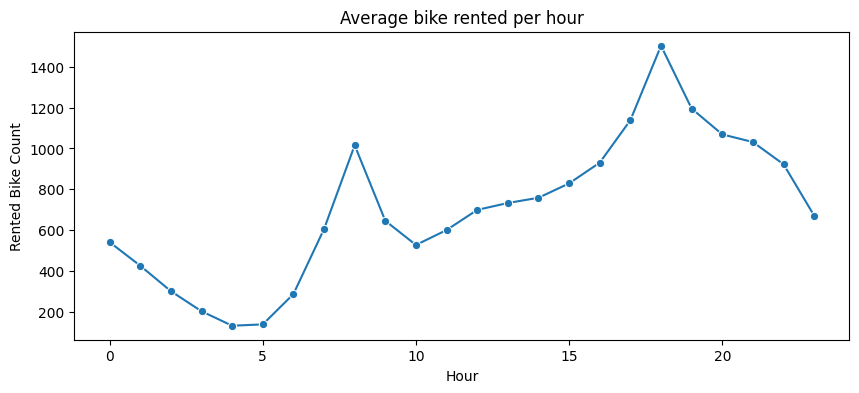

In [39]:
# ploting line graph
# group by Hrs and get average Bikes rented, and precent change
avg_rent_hrs = data_2.groupby('hour')['rented_bike_count'].mean()

# plot average rent over time(hrs)
plt.figure(figsize=(10,4))
sns.lineplot(data=avg_rent_hrs, marker='o')
plt.ylabel("Rented Bike Count")
plt.xlabel("Hour")
plt.title('Average bike rented per hour')
plt.show()
# a=avg_rent_hrs.plot(legend=True,marker='o',title="Average Bikes Rented Per Hr")
# a.set_xticks(range(len(avg_rent_hrs)))
# a.set_xticklabels(avg_rent_hrs.index.tolist(), rotation=85)

##### 1. Why did you pick the specific chart?

A line plot, also known as a line chart or line graph, is a way to visualize the trend of a single variable over time. It uses a series of data points connected by a line to show how the value of the variable changes over time.

To see how rented bike demand is distributed over 24 hours time.

##### 2. What is/are the insight(s) found from the chart?

From above line plot we can clearly see that there is high demand in the morning and in the evening.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Time slot of morning and evening has high demand.

#### Chart - 6 : Bike demand throughout the day

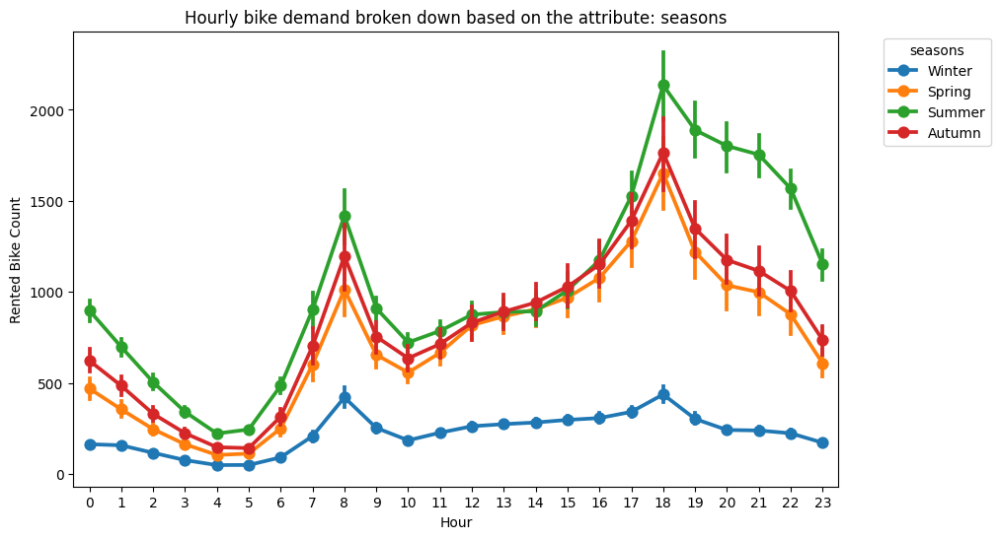

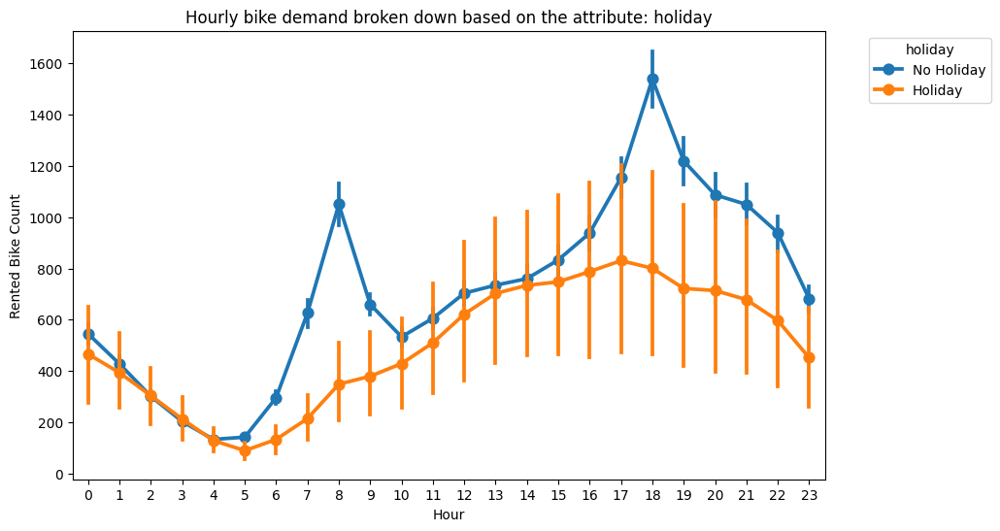

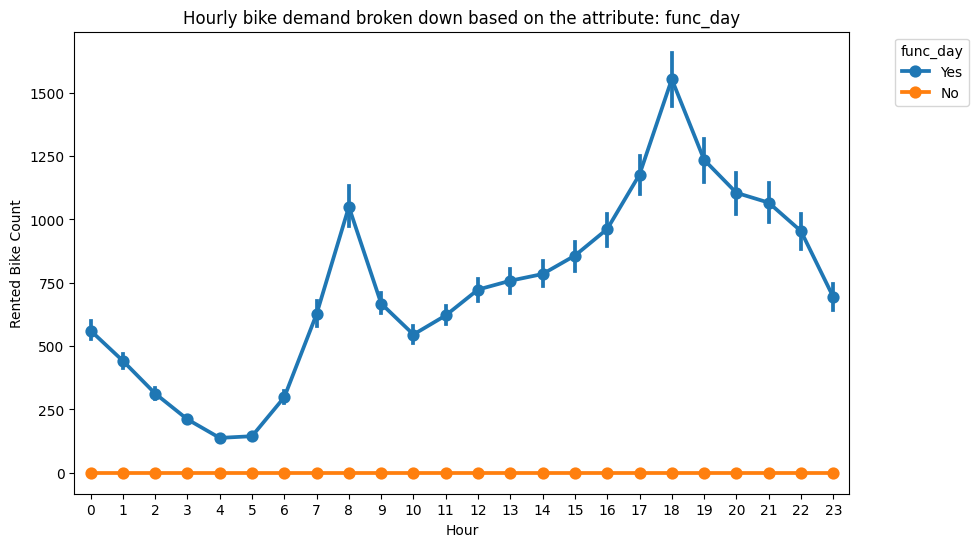

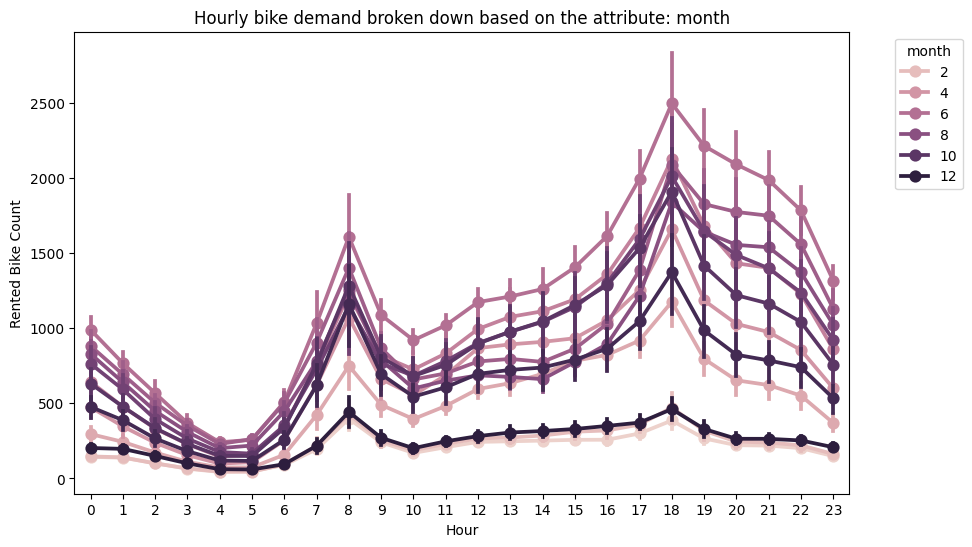

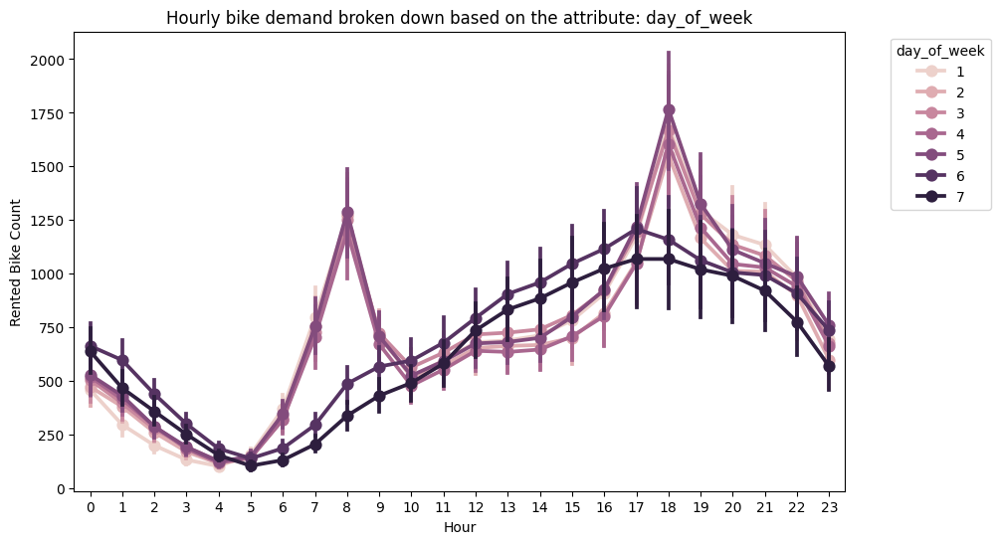

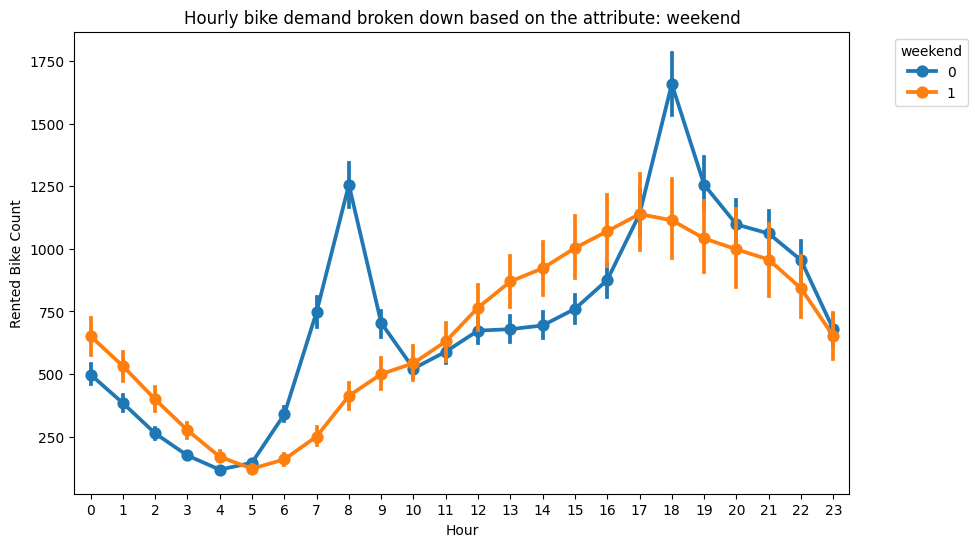

In [40]:
# Chart - 6 visualization code
for i in cat_var:
  if i == 'hour':
    continue
  else:
    fig, ax = plt.subplots(figsize=(10,6))
    sns.pointplot(data=data_2, x='hour', y='rented_bike_count', hue=i, ax=ax)
    plt.ylabel("Rented Bike Count")
    plt.xlabel("Hour")
    plt.title('Hourly bike demand broken down based on the attribute: '+i)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left',title=i)
    plt.show()

##### 1. Why did you pick the specific chart?

To show the demand of rented bike throughout the day on the basis of other categorical variable.

##### 2. What is/are the insight(s) found from the chart?

From above line plots we see that :

1. Peak hours from 7 to 9 in a morning and 5 to 7 in a evening it is showing higher demand in all seasons.

2. Peak hour is same for holiday.

3. In a Functioning day, the peak hour is same 5 to 7 in a morning and 7 to 9 in a evening. But Rented bike has no demand for non-functioning day.

4. From the month 5 to 10 (May - October) the demand of the rented bike is high as compare to other months.These months came inside the summer season.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, from this analysis we figure out some key factors such as high demand in morning and evening slot in all the seasons.

#### Chart - 7 : Categorical plot for seasons

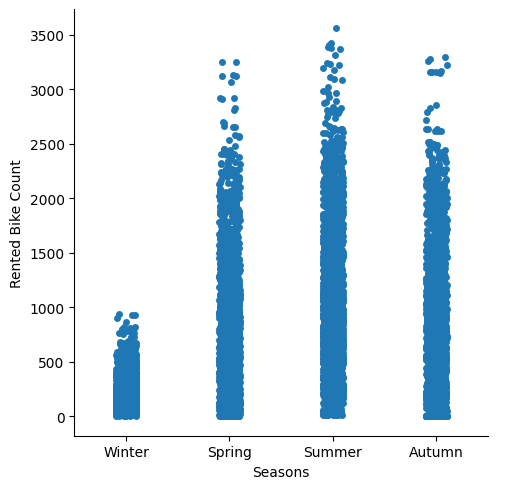

In [41]:
# plot for rented bike count seasonly
sns.catplot(x='seasons',y='rented_bike_count',data=data_2)
plt.ylabel("Rented Bike Count")
plt.xlabel("Seasons")
plt.show()

##### 1. Why did you pick the specific chart?

To see the distribution of the rented bike on basis of season column.

##### 2. What is/are the insight(s) found from the chart?

From above catplot we got to know that:

1. There is low demand in winter and high demand in summer.
2. In seasons like summer ,spring and autumn upto the 2500 bike counts distribution is seen dense.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, from this catplot we know that there is high bike count upto the 2500.

#### Chart - 8 : Pie plot for seasons

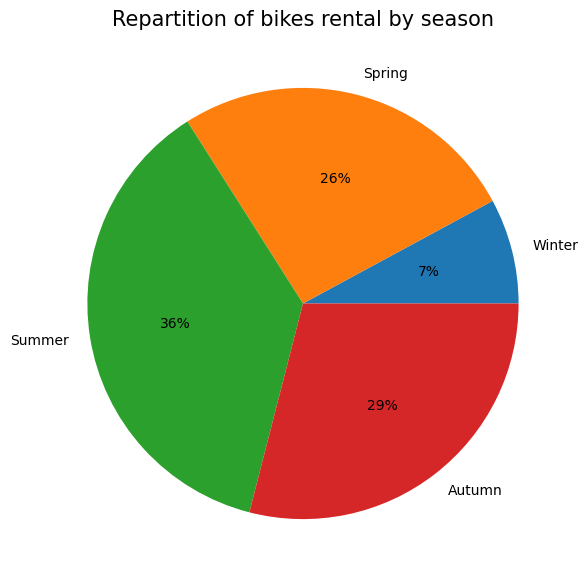

In [42]:
# Chart - 8 visualization code
Winter=data_2[data_2["seasons"]=='Winter'].sum()
Spring=data_2[data_2["seasons"]=='Spring'].sum()
Summer=data_2[data_2["seasons"]=='Summer'].sum()
Autumn=data_2[data_2["seasons"]=='Autumn'].sum()

BikeSeasons={"Winter":Winter["rented_bike_count"],"Spring":Spring["rented_bike_count"],"Summer":Summer["rented_bike_count"],"Autumn":Autumn["rented_bike_count"]}
plt.gcf().set_size_inches(7,7)
plt.pie(BikeSeasons.values(),labels=BikeSeasons.keys(), autopct='%1d%%');
plt.title("Repartition of bikes rental by season", fontsize=15)
plt.show()

##### 1. Why did you pick the specific chart?

Pie chart to used see percentage distribution of rented bike on the basis of seasons.

##### 2. What is/are the insight(s) found from the chart?

From above pie chart:

1. In year data season summer contributes around 36% then autumn around 29%
2. Lowest demand in winter, it contributes around only 7%

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This insights only tell about percentage contribution of year data of season variable, which clearly gave indication about demand.

#### Chart - 9 : Temperature and Solar Radiation over time

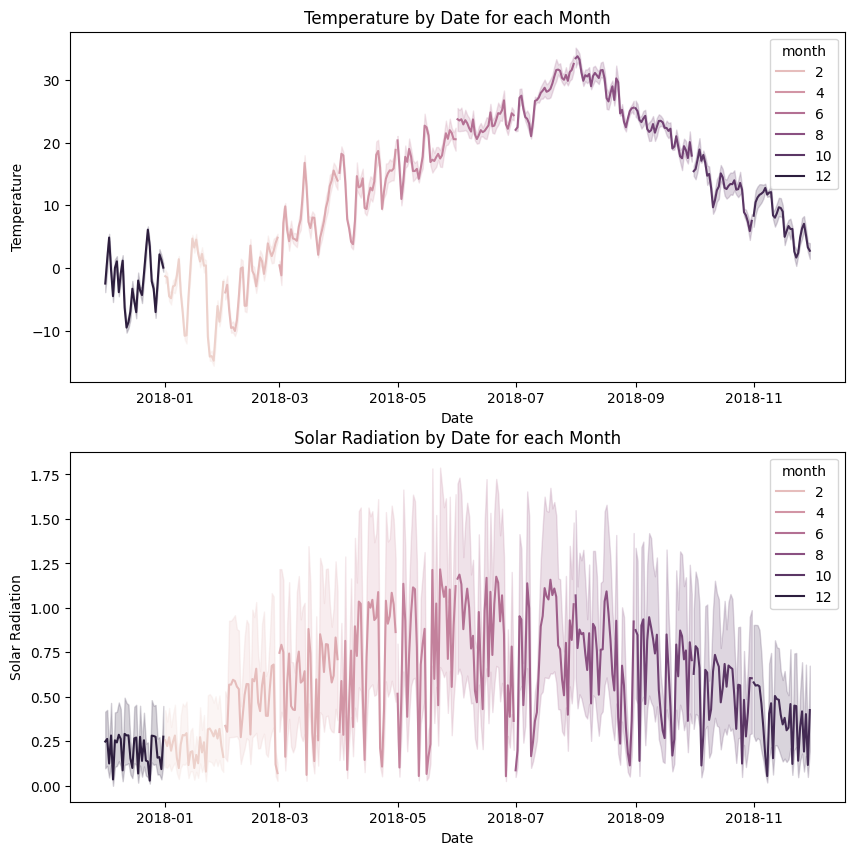

In [43]:
# Chart - 9 visualization code
plt.figure(figsize=(10,10))

# Plot temperature
plt.subplot(2, 1, 1)
sns.lineplot(x='date', y='temperature', hue='month', data=data_2)
plt.ylabel('Temperature')
plt.xlabel('Date')
plt.title("Temperature by Date for each Month")

# Plot humidity
plt.subplot(2, 1, 2)
sns.lineplot(x='date', y='solar_radiation', hue='month', data=data_2)
plt.ylabel('Solar Radiation')
plt.xlabel('Date')
plt.title("Solar Radiation by Date for each Month")
plt.show()

##### 1. Why did you pick the specific chart?

Line charts are a useful tool for visualizing trends over time. It allows us in easy identification of patterns and changes over time.

##### 2. What is/are the insight(s) found from the chart?

As expected temperature rises during summer months and lowers in winter months.

Similarly solar radiation is more in summer months compared to winter months, also huge fluctuations in solar radiation may be caused due to day-night cycle as there is no sunlight at night time.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This may not be much helpful in creating positive business impact as this is a natural phenomenon and we can't control it.

#### Chart - 10 : Avg Rented Bike Count by Wind speed

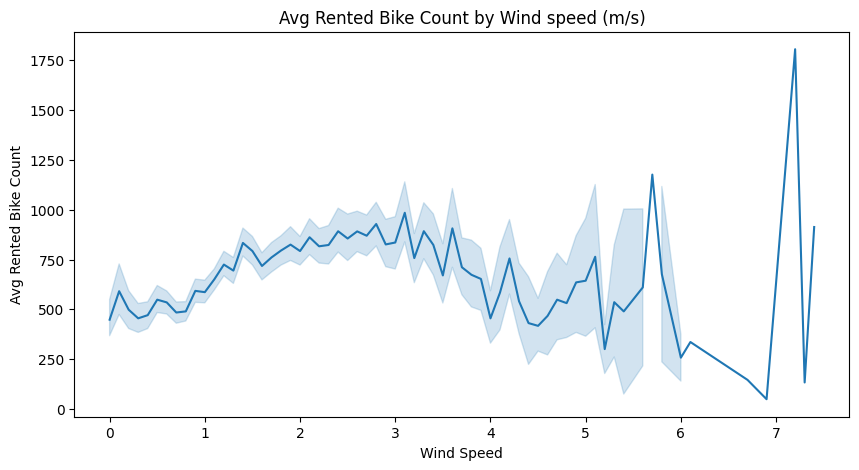

In [44]:
# Chart - 10 visualization code
plt.figure(figsize=(10,5))
sns.lineplot(x='wind_speed', y='rented_bike_count', data=data_2)
plt.ylabel("Avg Rented Bike Count")
plt.xlabel("Wind Speed")
plt.title("Avg Rented Bike Count by Wind speed (m/s)")
plt.show()

In [45]:
data_2['wind_speed'].value_counts()

1.1    420
1.2    403
1.0    388
0.9    388
0.8    385
      ... 
7.2      1
6.1      1
7.3      1
6.9      1
5.7      1
Name: wind_speed, Length: 65, dtype: int64

##### 1. Why did you pick the specific chart?

Line charts are a useful tool for visualizing trends over time. It allows us in easy identification of patterns and changes over time (in this case over wind speed).

##### 2. What is/are the insight(s) found from the chart?

Initially wind speed increases, the demand increases since flowing air creates better weather and less heat, although too high wind speed created storm and all so too high speed leads to decreases in demand.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This may not be much helpful in creating positive business impact as this is a natural phenomenon and we can't control it.

#### Chart - 11 : Avg Rented Bike Count by Humidity

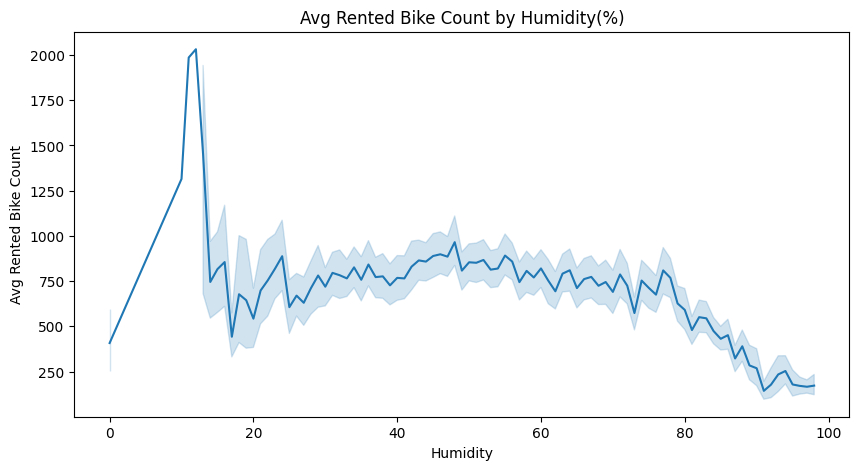

In [46]:
# Chart - 11 visualization code
plt.figure(figsize=(10,5))
sns.lineplot(x='humidity', y='rented_bike_count', data=data_2)
plt.ylabel("Avg Rented Bike Count")
plt.xlabel("Humidity")
plt.title("Avg Rented Bike Count by Humidity(%)")
plt.show()

In [47]:
data_2['humidity'].value_counts()

53    173
97    173
43    164
57    159
56    157
     ... 
19     11
13      3
10      1
12      1
11      1
Name: humidity, Length: 90, dtype: int64

##### 1. Why did you pick the specific chart?

Line charts are a useful tool for visualizing trends over time. It allows us in easy identification of patterns and changes over time (in this case over humidity).

##### 2. What is/are the insight(s) found from the chart?

After certain level as humidity increases demand decreases as too much humidity may generally caused due to rain or snowfall as it clearly shows that leads to decrease in demand.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This may not be much helpful in creating positive business impact as this is a natural phenomenon and we can't control it.

#### Chart - 12 : Correlation Heatmap

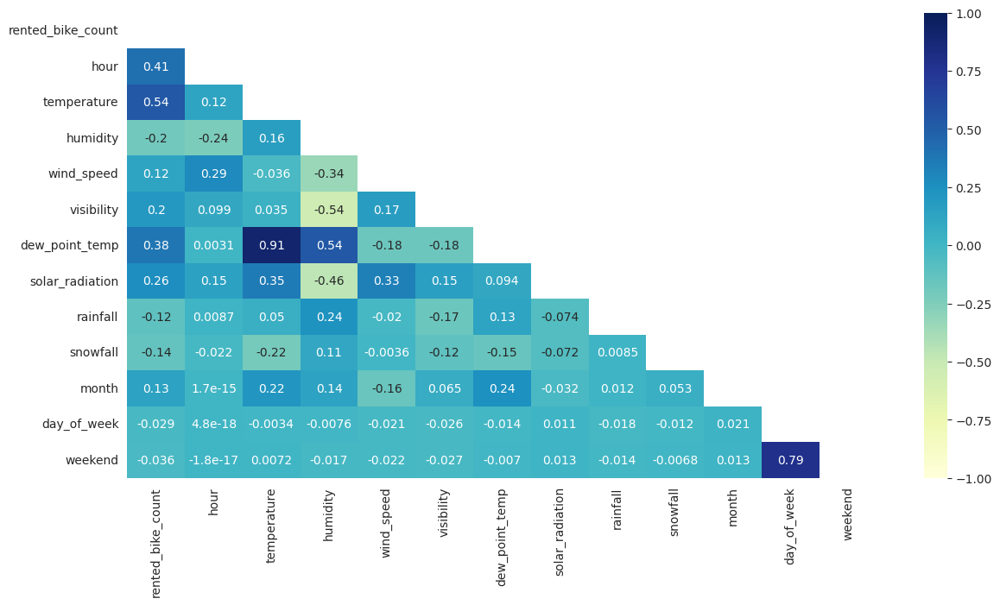

In [48]:
# Correlation Heatmap visualization code
corr = data_2.corr()
mask = np.zeros_like(corr)

mask[np.triu_indices_from(mask)] = True

with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(14,7))
    ax = sns.heatmap(corr , mask=mask, vmin = -1,vmax=1, annot = True, cmap="YlGnBu")

##### 1. Why did you pick the specific chart?

The correlation coefficient is a measure of the strength and direction of a linear relationship between two variables. A correlation matrix is used to summarize the relationships among a set of variables and is an important tool for data exploration and for selecting which variables to include in a model. The range of correlation is [-1,1].

Thus to know the correlation between all the variables along with the correlation coeficients, we have used correlation heatmap.

##### 2. What is/are the insight(s) found from the chart?

From above correlation map we can clearly see that:

1. There is high multicolinearity between independent variable (i.e temperature & dew point temp, humidity & dew point temp, weekend & day of week).
2. There is correlation of temperature, hour, dew point temp & solar radiation with dependent variable rented bike.
3. Other than that we didnt see any correlation.

#### Chart - 13 : Pair Plot

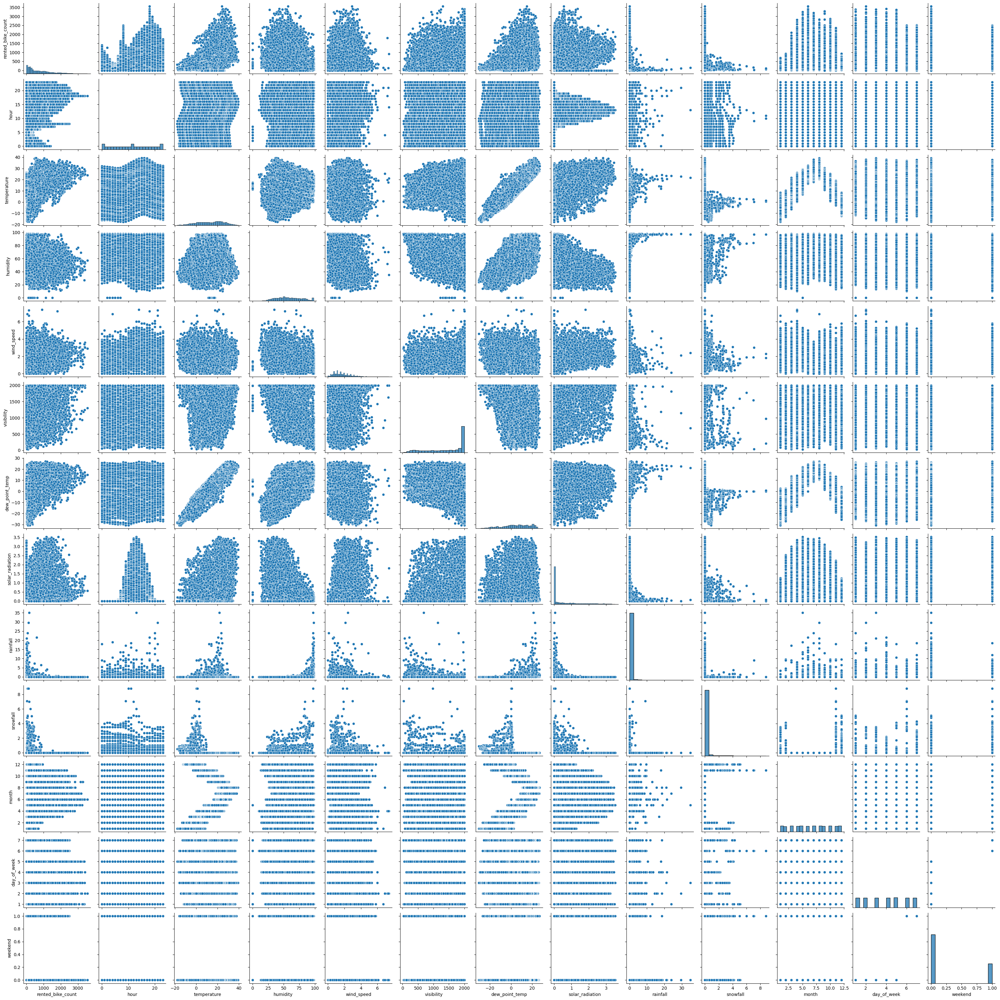

In [49]:
# Pair Plot visualization code
sns.pairplot(data_2)
plt.show()

##### 1. Why did you pick the specific chart?

A pairplot, also known as a scatterplot matrix, is a visualization that allows you to visualize the relationships between all pairs of variables in a dataset. It is a useful tool for data exploration because it allows you to quickly see how all of the variables in a dataset are related to one another.

Thus, we used pair plot to analyse the patterns of data and relationship between the features. It's exactly same as the correlation map but here you will get the graphical representation.

##### 2. What is/are the insight(s) found from the chart?

From above pair plot we got to know that, there is not clear linear relationship between variables. Other than dew point temp, temperature & solar radiation there is not any relationship.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Based on above chart experiments i have noticed that our dependent variable (Rented Bike Demand) does not seems to normally distributed so i have made hypothetical assumption that our data is normally distributed and for that i have decided to do statistical analysis.

1.   Rented Bike Demand in **hot weather** is higher compared to demand in **cold weather**.
2.   Rented Bike Demand during **rush hour** (*7-9AM & 5-7PM*) and **non-rush hour** are different.
3.   Average Rented Bike Demand is different in different seasons.

### Hypothetical Statement - 1 :
Rented Bike Demand in **hot weather** is higher compared to demand in **cold weather**.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: $H_o : μ_{cold} = μ_{hot}$

Alternate Hypothesis : $H_1 : μ_{cold} \neq μ_{hot}$

Test Type: Two-sample t-test

#### 2. Perform an appropriate statistical test.

In [50]:
# Perform Statistical Test to obtain P-Value
# Split the data into the 'hot' and 'cold' temperature groups
hot_temps = data_2[data_2['temperature'] >= 20]['rented_bike_count']
cold_temps = data_2[data_2['temperature'] < 20]['rented_bike_count']

In [51]:
print("Cold temperature Bike Demand Variance: ", np.var(cold_temps))
print("Hot temperature Bike Demand Variance: ", np.var(hot_temps))

Cold temperature Bike Demand Variance:  243195.07698899662
Hot temperature Bike Demand Variance:  505140.86009853514


In [52]:
# Sample sizes for different temperature groups
print("Hot Temp sample size:", hot_temps.shape[0])
print("Cold Temp sample size:", cold_temps.shape[0])

Hot Temp sample size: 2928
Cold Temp sample size: 5832


In [53]:
# Perform the t-test
import scipy
t_stat, p_val = scipy.stats.ttest_ind(hot_temps, cold_temps, equal_var=False)

if p_val < 0.05:
    print(f"Since p-value ({p_val}) is less than 0.05, we reject null hypothesis.\nHence, There is a significant difference in mean bike rentals between the 'hot' and 'cold' temperature groups.")
else:
  print(f"Since p-value ({p_val}) is greater than 0.05, we fail to reject null hypothesis.\nHence, There is no significant difference in mean bike rentals between the 'hot' and 'cold' temperature groups.")

Since p-value (0.0) is less than 0.05, we reject null hypothesis.
Hence, There is a significant difference in mean bike rentals between the 'hot' and 'cold' temperature groups.


##### Which statistical test have you done to obtain P-Value?

I have used Two sample T-test as the statistical testing to obtain P-Value and found the result that Null hypothesis has been rejected and Mean Rented Bike counts different in hot temperatures and cold temperaures.

##### Why did you choose the specific statistical test?

The two sample t-test is used to determine if there is a significant difference between the means of two groups, making it an appropriate test for comparing the mean number of *Rented Bike Count* between the *hot* and *cold* temperature groups.

Also We know from previous charts that **Rented Bike Count** is **right skewed** with **large sample sizes** (i.e., $n_{hot}=2928$ & $n_{cold}=5832$) and we **don't know $\sigma_{p}$**.

### Hypothetical Statement - 2 :
Rented Bike Demand during **rush hour** (*7-9AM & 5-7PM*) is higher compared to **non-rush hour**.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: $H_o : μ_{rush} = μ_{non-rush}$

Alternate Hypothesis : $H_1 : μ_{rush} \neq μ_{non-rush}$

Test Type: Two-sample t-test

#### 2. Perform an appropriate statistical test.

In [54]:
# Perform Statistical Test to obtain P-Value
# Create subsets of the data based on hour
rush_hour = data_2[(data_2['hour'] >= 7) & (data_2['hour'] <= 9) | (data_2['hour'] >= 17) & (data_2['hour'] <= 19)]['rented_bike_count']
non_rush_hour = data_2[~((data_2['hour'] >= 7) & (data_2['hour'] <= 9) | (data_2['hour'] >= 17) & (data_2['hour'] <= 19))]['rented_bike_count']

In [55]:
print("Rush Hour Bike Demand Variance: ", np.var(rush_hour))
print("Non-Rush Hour Bike Demand Variance: ", np.var(non_rush_hour))

Rush Hour Bike Demand Variance:  651191.7549925982
Non-Rush Hour Bike Demand Variance:  294088.66494823346


In [56]:
# Sample sizes for different hours
print("Rush Hour sample size:", rush_hour.shape[0])
print("Non-Rush Hour sample size:", non_rush_hour.shape[0])

Rush Hour sample size: 2190
Non-Rush Hour sample size: 6570


In [57]:
# Conduct a two-sample t-test to compare the mean bike rental demand during rush hour with the mean bike rental demand during non-rush hour times
t_stat, p_val = scipy.stats.ttest_ind(rush_hour, non_rush_hour, equal_var=False)

# Print the t-test results
# print('t-statistic:', t_stat)
# print('p-value:', p_val)

if p_val < 0.05:
    print(f"Since p-value ({p_val}) is less than 0.05, we reject null hypothesis.\nHence, There is a significant difference in mean bike rentals between the 'rush hour' and 'non-rush hour' times of day.")
else:
  print(f"Since p-value ({p_val}) is greater than 0.05, we fail to reject null hypothesis.\nHence, There is no significant difference in mean bike rentals between the 'rush hour' and 'non-rush hour' times of day.")

Since p-value (9.381784283723713e-104) is less than 0.05, we reject null hypothesis.
Hence, There is a significant difference in mean bike rentals between the 'rush hour' and 'non-rush hour' times of day.


##### Which statistical test have you done to obtain P-Value?

I have used Two sample T-test as the statistical testing to obtain P-Value and found the result that Null hypothesis has been rejected and Mean Rented Bike counts different in rush hours and non-rush hours.

##### Why did you choose the specific statistical test?

The two sample t-test is used to determine if there is a significant difference between the means of two groups, making it an appropriate test for comparing the mean number of Rented Bike Count between the rush hours and non-rush hours.

Also We know from previous charts that **Rented Bike Count** is **right skewed** with **large sample sizes** (i.e.,  $n_{rush}=2190$  &  $n_{non-rush}=6570$) and we **don't know $\sigma_{p}$**.

### Hypothetical Statement - 3 :
Rented Bike Demand is different in different seasons with highest in summer and lowest in winter.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis: $H_o :$ **No significant difference** between rented bike counts for different seasons.

Alternate Hypothesis : $H_1 :$ **Significant difference** between rented bike counts for different seasons.

Test Type: One-way ANOVA test

#### 2. Perform an appropriate statistical test.

In [58]:
# Perform Statistical Test to obtain P-Value
# Sample sizes for different seasons
data_2.groupby('seasons')['rented_bike_count'].count()

seasons
Autumn    2184
Spring    2208
Summer    2208
Winter    2160
Name: rented_bike_count, dtype: int64

In [59]:
# Group the data by season and calculate the mean number of bike rentals for each season
season_means = data_2.groupby('seasons')['rented_bike_count'].mean()

# Conduct the ANOVA test
f_stat, p_value = scipy.stats.f_oneway(data_2.loc[data_2['seasons']=='Spring', 'rented_bike_count'],
                                  data_2.loc[data_2['seasons']=='Summer', 'rented_bike_count'],
                                  data_2.loc[data_2['seasons']=='Autumn', 'rented_bike_count'],
                                  data_2.loc[data_2['seasons']=='Winter', 'rented_bike_count'])

# Print the results
print('F-statistic:', f_stat)
print('p-value:', p_val)
print()

# Conduct Tukey's HSD test for detailed difference b/w each groups
from statsmodels.stats.multicomp import pairwise_tukeyhsd
tukey_results = pairwise_tukeyhsd(data_2['rented_bike_count'], data_2['seasons'])

# Print the Tukey HSD test results
print(tukey_results)

F-statistic: 776.4678149879506
p-value: 9.381784283723713e-104

  Multiple Comparison of Means - Tukey HSD, FWER=0.05   
group1 group2  meandiff p-adj   lower     upper   reject
--------------------------------------------------------
Autumn Spring  -89.5667   0.0 -134.0266  -45.1069   True
Autumn Summer  214.4754   0.0  170.0156  258.9352   True
Autumn Winter -594.0568   0.0 -638.7616  -549.352   True
Spring Summer  304.0421   0.0  259.7039  348.3803   True
Spring Winter   -504.49   0.0 -549.0739 -459.9062   True
Summer Winter -808.5322   0.0  -853.116 -763.9483   True
--------------------------------------------------------


##### Which statistical test have you done to obtain P-Value?

I have used One-way ANOVA test as the statistical testing to obtain P-Value and found the result that Null hypothesis has been rejected and Mean Rented Bike counts are significantly different in different seasons.

##### Why did you choose the specific statistical test?

The one-way ANOVA test is used to determine if there is a significant difference between the means of **more than two groups**, making it an appropriate test for comparing the mean number of Rented Bike Count between different seasons.

Also We know from previous charts that **Rented Bike Count** is **right skewed** with **large sample sizes** (i.e.,  $n_{autumn}=2184$, $n_{spring}=2208$, $n_{summer}=2208$ , $n_{winter}=2160$).

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [60]:
# Handling Missing Values & Missing Value Imputation
data_2.isna().sum().sum()

0

#### What all missing value imputation techniques have you used and why did you use those techniques?

There are no missing values to handle in the given dataset.

### 2. Handling Outliers

In [ ]:
'''# Handling Outliers & Outlier treatments
# Removing outliers by Using IQR method:
q1, q3, median = data_2.rented_bike_count.quantile([0.25,0.75,0.5])
lower_limit = q1 - 1.5*(q3-q1)
upper_limit = q3 + 1.5*(q3-q1)
data_2['rented_bike_count'] = np.where(data_2['rented_bike_count'] > upper_limit, median,np.where(data_2['rented_bike_count'] < lower_limit,median,data_2['rented_bike_count']))

# Removing outliers by Capping:
for col in ['wind_speed','solar_radiation','rainfall','snowfall']:
  upper_limit = data_2[col].quantile(0.99)
  data_2[col] = np.where(data_2[col] > upper_limit, upper_limit, data_2[col])'''

"# Handling Outliers & Outlier treatments\n# Removing outliers by Using IQR method:\nq1, q3, median = data_2.rented_bike_count.quantile([0.25,0.75,0.5])\nlower_limit = q1 - 1.5*(q3-q1)\nupper_limit = q3 + 1.5*(q3-q1)\ndata_2['rented_bike_count'] = np.where(data_2['rented_bike_count'] > upper_limit, median,np.where(data_2['rented_bike_count'] < lower_limit,median,data_2['rented_bike_count']))\n\n# Removing outliers by Capping:\nfor col in ['wind_speed','solar_radiation','rainfall','snowfall']:\n  upper_limit = data_2[col].quantile(0.99)\n  data_2[col] = np.where(data_2[col] > upper_limit, upper_limit, data_2[col])"

##### What all outlier treatment techniques have you used and why did you use those techniques?

Here i used IQR method and Capping method, Based on IQR method i set Upper limit and Lower limit of rented bike count and convert those outliers into median values.

Also i have capp outliers upto 99th percentile and above that i convert those outliers into upper limit value.

###Note :-

1. I have tried to remove the outliers but it has seen that there is drop in performance after removing the outliers around 10% drop in model performance

So, i have decided that i will perform the model without removing the outliers.

### 3. Categorical Encoding

In [61]:
# Converting snowfall and rainfall to categorical attributes
data_2['snowfall'] = data_2['snowfall'].apply(lambda x: 1 if x>0 else 0)
data_2['rainfall'] = data_2['rainfall'].apply(lambda x: 1 if x>0 else 0)

In [62]:
# Encoding the visibility column
data_2['visibility'] = data_2['visibility'].apply(lambda x: 0 if 0<=x<=399 else (1 if 400<=x<=999 else 2))

In [63]:
# Encoding
data_2['func_day'] = np.where(data_2['func_day'] == 'Yes',1,0)
data_2['holiday'] = np.where(data_2['holiday'] == 'Holiday',1,0)

In [64]:
# One hot encoding
data_2 = pd.get_dummies(data_2, columns = ['hour', 'visibility', 'month', 'day_of_week' ])

In [66]:
# Dataset Columns
data_2.columns

Index(['date', 'rented_bike_count', 'temperature', 'humidity', 'wind_speed',
       'dew_point_temp', 'solar_radiation', 'rainfall', 'snowfall', 'seasons',
       'holiday', 'func_day', 'weekend', 'hour_0', 'hour_1', 'hour_2',
       'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7', 'hour_8', 'hour_9',
       'hour_10', 'hour_11', 'hour_12', 'hour_13', 'hour_14', 'hour_15',
       'hour_16', 'hour_17', 'hour_18', 'hour_19', 'hour_20', 'hour_21',
       'hour_22', 'hour_23', 'visibility_0', 'visibility_1', 'visibility_2',
       'month_1', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6',
       'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12',
       'day_of_week_1', 'day_of_week_2', 'day_of_week_3', 'day_of_week_4',
       'day_of_week_5', 'day_of_week_6', 'day_of_week_7'],
      dtype='object')

#### What all categorical encoding techniques have you used & why did you use those techniques?

Since there are very few day on which there was snowfall / rainfall, it is in my interest that i convert these columns to binary categorical columns indicating whether there was rainfall / snowfall at that particular hour

For visibility

When

Visibility >= 20 Km ---> Clear (high visibility)

4 Km <= Visibility < 10 Km ---> Haze (medium visibility)

Visibility < 4 Km ---> Fog (low visibility)

Converting visibility based on the above mentioned threshold values. Since they are ordinal, we can encode them as 0 (low visibility), 1 (medium visibility), 2 (high visibility)

For func day and holiday
There are two categories whether its holiday or func day so we use 0 and 1 for that.

For Hour, visibility, month & day of the week
we use here one hot encoding.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

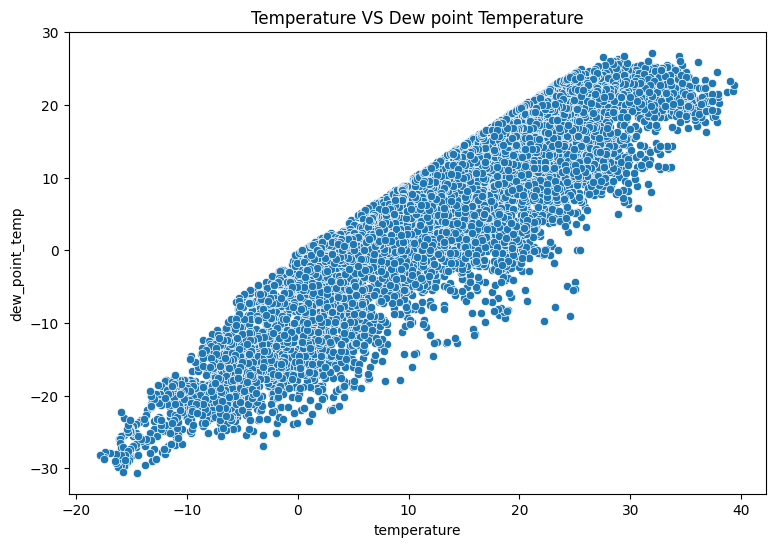

In [67]:
# Manipulate Features to minimize feature correlation and create new features

# We see that the temperature and dew temperature are highly correlated

# Plotting Scatter plot to visualize the relationship between
# temperature and dew point temperature
plt.figure(figsize=(9,6))
sns.scatterplot(x='temperature',y='dew_point_temp',data=data_2)
plt.xlabel('temperature')
plt.ylabel('dew_point_temp')
plt.title('Temperature VS Dew point Temperature')
plt.show()

In [68]:
# Correlation
data_2[['temperature','dew_point_temp']].corr()

,temperature,dew_point_temp
temperature,1.000000,0.912798
dew_point_temp,0.912798,1.000000


In [69]:
# Creating new temperature column with 50% of both temp
data_2['temp'] = 0.5*data_2['temperature'] + 0.5*data_2['dew_point_temp']

#### 2. Feature Selection

In [70]:
# Select your features wisely to avoid overfitting
features = [i for i in data_2.columns if i not in ['rented_bike_count','temperature','dew_point_temp']]
features

['date',
 'humidity',
 'wind_speed',
 'solar_radiation',
 'rainfall',
 'snowfall',
 'seasons',
 'holiday',
 'func_day',
 'weekend',
 'hour_0',
 'hour_1',
 'hour_2',
 'hour_3',
 'hour_4',
 'hour_5',
 'hour_6',
 'hour_7',
 'hour_8',
 'hour_9',
 'hour_10',
 'hour_11',
 'hour_12',
 'hour_13',
 'hour_14',
 'hour_15',
 'hour_16',
 'hour_17',
 'hour_18',
 'hour_19',
 'hour_20',
 'hour_21',
 'hour_22',
 'hour_23',
 'visibility_0',
 'visibility_1',
 'visibility_2',
 'month_1',
 'month_2',
 'month_3',
 'month_4',
 'month_5',
 'month_6',
 'month_7',
 'month_8',
 'month_9',
 'month_10',
 'month_11',
 'month_12',
 'day_of_week_1',
 'day_of_week_2',
 'day_of_week_3',
 'day_of_week_4',
 'day_of_week_5',
 'day_of_week_6',
 'day_of_week_7',
 'temp']

In [71]:
# Remove multicollinearity by using VIF technique
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [72]:
continuous_variables = ['temperature', 'humidity', 'wind_speed', 'dew_point_temp', 'solar_radiation', 'temp']

In [73]:
continuous_feature_df = pd.DataFrame(data_2[continuous_variables])

In [74]:
continuous_feature_df

,temperature,humidity,wind_speed,dew_point_temp,solar_radiation,temp
0,-5.2,37,2.2,-17.6,0.0,-11.40
1,-5.5,38,0.8,-17.6,0.0,-11.55
2,-6.0,39,1.0,-17.7,0.0,-11.85
3,-6.2,40,0.9,-17.6,0.0,-11.90
4,-6.0,36,2.3,-18.6,0.0,-12.30
...,...,...,...,...,...,...
8755,4.2,34,2.6,-10.3,0.0,-3.05
8756,3.4,37,2.3,-9.9,0.0,-3.25
8757,2.6,39,0.3,-9.9,0.0,-3.65
8758,2.1,41,1.0,-9.8,0.0,-3.85


In [75]:
calc_vif(data_2[[i for i in continuous_feature_df]])

,variables,VIF
0,temperature,inf
1,humidity,3.728151
2,wind_speed,4.486642
3,dew_point_temp,inf
4,solar_radiation,2.619125
5,temp,inf


In [76]:
# Removing Temperature and dew point temperature
calc_vif(data_2[[i for i in continuous_feature_df if i not in ['dew_point_temp','temperature']]])

,variables,VIF
0,humidity,3.539282
1,wind_speed,3.479585
2,solar_radiation,1.956713
3,temp,2.027904


In [77]:
# Dropping data, weekend, temperature and dew_point_temperature
data_2.drop(['date','weekend', 'dew_point_temp', 'temperature','seasons'],axis=1, inplace=True)

In [78]:
# This is the final data for modeling
data_2.head()

,rented_bike_count,humidity,wind_speed,solar_radiation,rainfall,snowfall,holiday,func_day,hour_0,hour_1,...,month_11,month_12,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6,day_of_week_7,temp
0,254,37,2.2,0.0,0,0,0,1,1,0,...,0,1,0,0,0,0,1,0,0,-11.40
1,204,38,0.8,0.0,0,0,0,1,0,1,...,0,1,0,0,0,0,1,0,0,-11.55
2,173,39,1.0,0.0,0,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,-11.85
3,107,40,0.9,0.0,0,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,-11.90
4,78,36,2.3,0.0,0,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,-12.30


##### What all feature selection methods have you used  and why?

I have used pearson correlation coefficient to check correlation between variables and also with dependent variable.

And also i check the multicollinearity using VIF and remove those who are having high VIF value.

##### Which all features you found important and why?

From above methods i have found that there is high correlation between temperature and dew point temperature. So, i take 50 % of the both and create new variable 'temp' by adding both of them.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

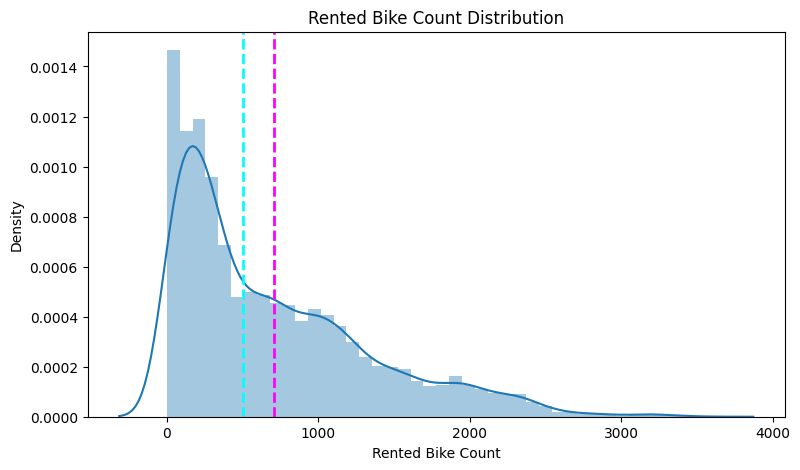

In [79]:
# Transform Your data
# Visualizing the distribution of the dependent variable - rental bike count
plt.figure(figsize=(9,5))
sns.distplot(data_2[dependent_variable])
plt.xlabel('Rented Bike Count')
plt.title('Rented Bike Count Distribution')
plt.axvline(data_2[dependent_variable[0]].mean(), color='magenta', linestyle='dashed', linewidth=2)
plt.axvline(data_2[dependent_variable[0]].median(), color='cyan', linestyle='dashed', linewidth=2)
plt.show()

In [80]:
# Skew of the dependent variable
data_2[dependent_variable].skew()

rented_bike_count    1.153428
dtype: float64

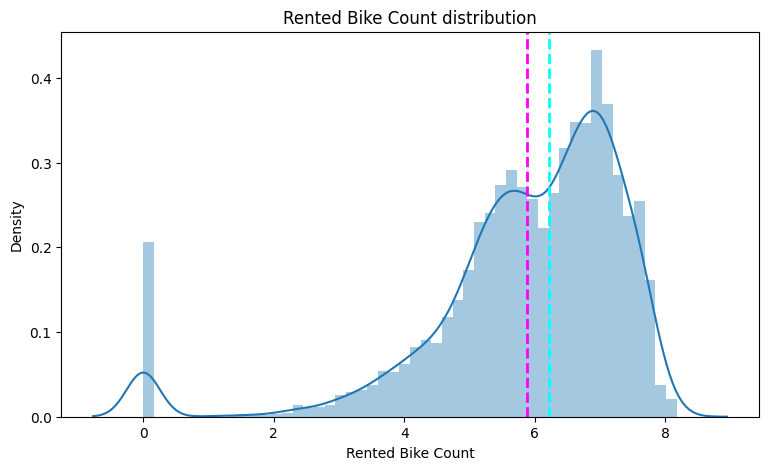

In [81]:
# Visualizing the distribution of dependent variable after log transformation
plt.figure(figsize=(9,5))
sns.distplot(np.log1p(data_2[dependent_variable]))
plt.xlabel('Rented Bike Count')
plt.title('Rented Bike Count distribution')
plt.axvline(np.log1p(data_2['rented_bike_count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
plt.axvline(np.log1p(data_2['rented_bike_count']).median(), color='cyan', linestyle='dashed', linewidth=2)
plt.show()

In [82]:
# Skew of the dependent variable after log transformation
np.log1p(data_2[dependent_variable]).skew()

rented_bike_count   -1.832199
dtype: float64

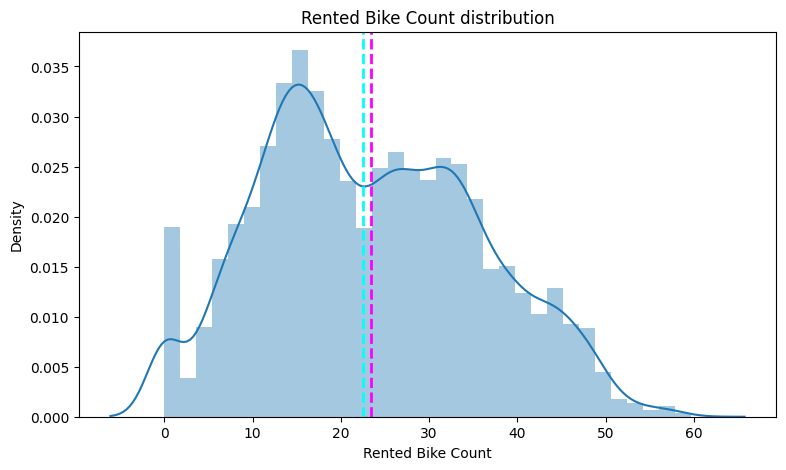

In [83]:
# Visualizing the distribution of dependent variable after sqrt transformation
plt.figure(figsize=(9,5))
sns.distplot(np.sqrt(data_2[dependent_variable]))
plt.xlabel('Rented Bike Count')
plt.title('Rented Bike Count distribution')
plt.axvline(np.sqrt(data_2['rented_bike_count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
plt.axvline(np.sqrt(data_2['rented_bike_count']).median(), color='cyan', linestyle='dashed', linewidth=2)
plt.show()

In [84]:
# Skew of the dependent variable after sqrt transformation
np.sqrt(data_2[dependent_variable]).skew()

rented_bike_count    0.237362
dtype: float64

In [85]:
# Defining dependent and independent variables
X = data_2.drop('rented_bike_count',axis=1)
y = np.sqrt(data_2[dependent_variable])

In [86]:
features

['date',
 'humidity',
 'wind_speed',
 'solar_radiation',
 'rainfall',
 'snowfall',
 'seasons',
 'holiday',
 'func_day',
 'weekend',
 'hour_0',
 'hour_1',
 'hour_2',
 'hour_3',
 'hour_4',
 'hour_5',
 'hour_6',
 'hour_7',
 'hour_8',
 'hour_9',
 'hour_10',
 'hour_11',
 'hour_12',
 'hour_13',
 'hour_14',
 'hour_15',
 'hour_16',
 'hour_17',
 'hour_18',
 'hour_19',
 'hour_20',
 'hour_21',
 'hour_22',
 'hour_23',
 'visibility_0',
 'visibility_1',
 'visibility_2',
 'month_1',
 'month_2',
 'month_3',
 'month_4',
 'month_5',
 'month_6',
 'month_7',
 'month_8',
 'month_9',
 'month_10',
 'month_11',
 'month_12',
 'day_of_week_1',
 'day_of_week_2',
 'day_of_week_3',
 'day_of_week_4',
 'day_of_week_5',
 'day_of_week_6',
 'day_of_week_7',
 'temp']

I have plotted distribution plot and also i did normality test and i have found that the data is not normally distributed, it needs transformation.

So, first i have calculate the skewness value and i have found that the rented bike attribute is positively skewed so i used log transformation but it affected negatively.

So, i finally used square root transformation & now the data looks normally distributed & skewness is also reduced.

### 6. Data Scaling

In [87]:
features = [i for i in data_2.columns if i not in ['rented_bike_count']]

In [88]:
# Scaling your data
scaler = StandardScaler()
X = scaler.fit_transform(data_2[features])

##### Which method have you used to scale you data and why?

In this i have different independent features of different scale so i have used standard scalar method to scale our independent features into one scale.

### 7. Dimensionality Reduction

In [89]:
# Processed Dataset shape (rows, columns)
data_2.shape

(8760, 55)

##### Do you think that dimensionality reduction is needed? Explain Why?

With 54 columns (independent features) and 8760 rows, and after doing all the feature engineering steps like removing multicolinearity, feature selection manupulations etc. I don't think I need dimensionality reduction here.

Essentially where high dimensions are a problem or where it is a particular point in the algorithm to dimension reduction.

In [ ]:
# DImensionality Reduction (If needed)

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

Answer Here.

### 8. Data Splitting

In [90]:
# Split your data to train and test. Choose Splitting ratio wisely.
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size = 0.2, random_state = 0)

##### What data splitting ratio have you used and why?

To train the model i have split the data into train and test using train_test_split method.

There are two competing concerns: with less training data, your parameter estimates have greater variance. With less testing data, your performance statistic will have greater variance. Broadly speaking you should be concerned with dividing data such that neither variance is too high, which is more to do with the absolute number of instances in each category rather than the percentage.

If we have a total of 100 instances, we should probably stick with cross validation as no single split is going to give you satisfactory variance in our estimates. If we have 100,000 instances, it doesn't really matter whether we choose an 80:20 split or a 90:10 split.

It is surprising to find out that 80/20 is quite a commonly occurring ratio, often referred to as the Pareto principle.

So, in this case i have split 80% of the data into train and 20% into test.

### 9. Handling Imbalanced Dataset

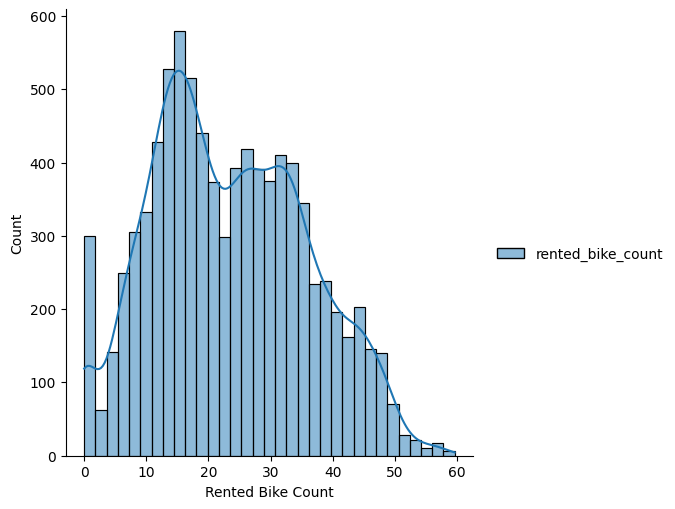

In [91]:
# Distribution of Rented Bike Count (target variable)
_ = sns.displot(y, kde=True)
plt.xlabel('Rented Bike Count')
plt.show()

##### Do you think the dataset is imbalanced? Explain Why.

Looking at the distribution of traget variable (i.e., Rented Bike Count), values are not concentrated in a narrow range, and is normally distributed accross wide range of values. So the dataset is not imbalanced.

In [ ]:
# Handling Imbalanced Dataset (If needed)

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***7. ML Model Implementation***

In [92]:
# Defining a function to print evaluation matrix
def evaluate_model(model, y_test, y_pred):

  '''takes model, y test and y pred values to print evaluation metrics, plot the actual and predicted values,
  plot the top 20 important features, and returns a list of the model scores'''

  # Squring the y test and and pred as we have used sqrt transformation
  y_t = np.square(y_test)
  y_p = np.square(y_pred)
  y_train2 = np.square(y_train)
  y_train_pred = np.square(model.predict(X_train))

  # Calculating Evaluation Matrix
  mse = mean_squared_error(y_t,y_p)
  rmse = np.sqrt(mse)
  mae = mean_absolute_error(y_t,y_p)
  r2_train = r2_score(y_train2, y_train_pred)
  r2 = r2_score(y_t,y_p)
  r2_adjusted = 1-(1-r2)*((len(X_test)-1)/(len(X_test)-X_test.shape[1]-1))

  # Printing Evaluation Matrix
  print("MSE :" , mse)
  print("RMSE :" ,rmse)
  print("MAE :" ,mae)
  print("Train R2 :" ,r2_train)
  print("Test R2 :" ,r2)
  print("Adjusted R2 : ", r2_adjusted)


  # plot actual and predicted values
  plt.figure(figsize=(13,4))
  plt.plot((y_p)[:100])
  plt.plot((np.array(y_t)[:100]))
  plt.legend(["Predicted","Actual"])
  plt.title('Actual and Predicted Bike Count', fontsize=15)

  try:
    importance = model.feature_importances_
  except:
    importance = model.coef_
  importance = np.absolute(importance)
  if len(importance)==len(features):
    pass
  else:
    importance = importance[0]

  # Feature importances
  feat = pd.Series(importance, index=features)
  plt.figure(figsize=(9,7))
  plt.title('Feature Importances (top 20) for '+str(model), fontsize = 15)
  plt.xlabel('Relative Importance')
  feat.nlargest(20).plot(kind='barh')


  model_score = [mse,rmse,mae,r2_train,r2,r2_adjusted]
  return model_score

In [93]:
# Create a score dataframe
score = pd.DataFrame(index = ['MSE', 'RMSE', 'MAE', 'Train R2', 'Test R2', 'Adjusted R2'])


### ML Model - 1 : Linear Regression

In [94]:
# Import the LinearRegression class
reg = LinearRegression()

# Fit the linear regression model to the training data
reg.fit(X_train, y_train)

# Predict on the model
y_pred_li = reg.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 88090.65909000415
RMSE : 296.80070601331823
MAE : 201.8068025396329
Train R2 : 0.784428200422006
Test R2 : 0.7895199410494631
Adjusted R2 :  0.7828222844888686


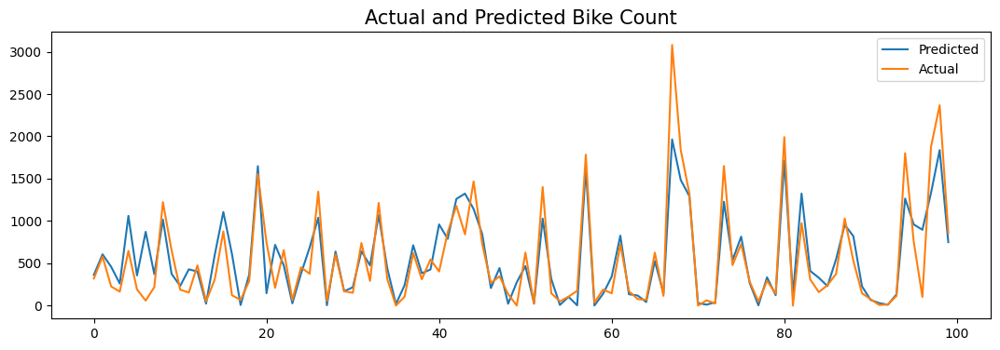

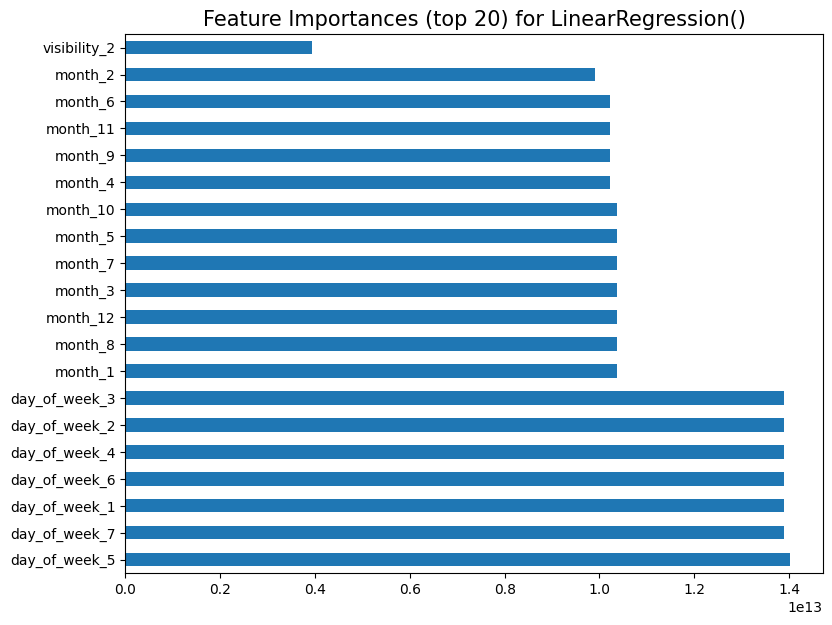

In [95]:
# Visualizing evaluation Metric Score chart
linear_score = evaluate_model(reg, y_test,y_pred_li)
# Evaluation Metric Score chart
score['Linear regression'] = linear_score

In [96]:
score

,Linear regression
MSE,88090.659090
RMSE,296.800706
MAE,201.806803
Train R2,0.784428
Test R2,0.789520
Adjusted R2,0.782822


#### 2. Cross- Validation & Hyperparameter Tuning

In [97]:
# Define the model
reg = LinearRegression()

# Define the parameters to be optimized
param_grid = {'fit_intercept': [True, False]}

# Perform grid search
grid_search = GridSearchCV(reg, param_grid, cv=5, scoring='r2', return_train_score=True)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LinearRegression(),
             param_grid={'fit_intercept': [True, False]},
             return_train_score=True, scoring='r2')

In [98]:
# Print the best parameters and the corresponding score
print("Best parameters: ", grid_search.best_params_)
print("Best R2 score: ", grid_search.best_score_)

Best parameters:  {'fit_intercept': True}
Best R2 score:  0.8030139022867928


In [99]:
# Use the best parameter to train the model
best_reg = grid_search.best_estimator_
best_reg.fit(X_train, y_train)

LinearRegression()

In [100]:
# Predict on test data
y_pred_li2 = best_reg.predict(X_test)

MSE : 88090.65909000415
RMSE : 296.80070601331823
MAE : 201.8068025396329
Train R2 : 0.784428200422006
Test R2 : 0.7895199410494631
Adjusted R2 :  0.7828222844888686


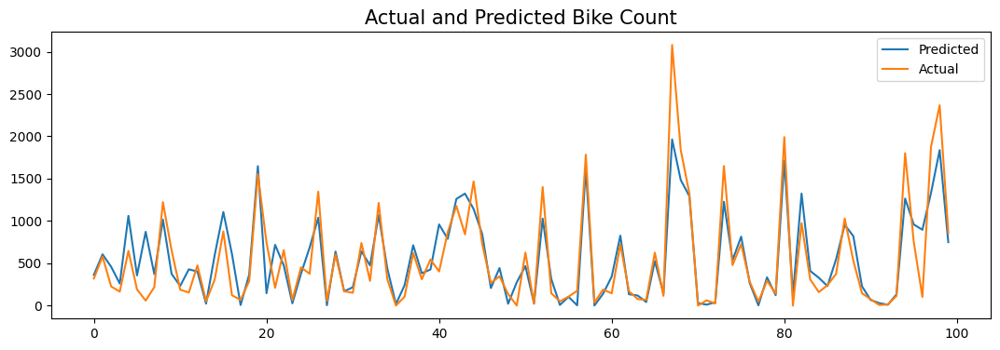

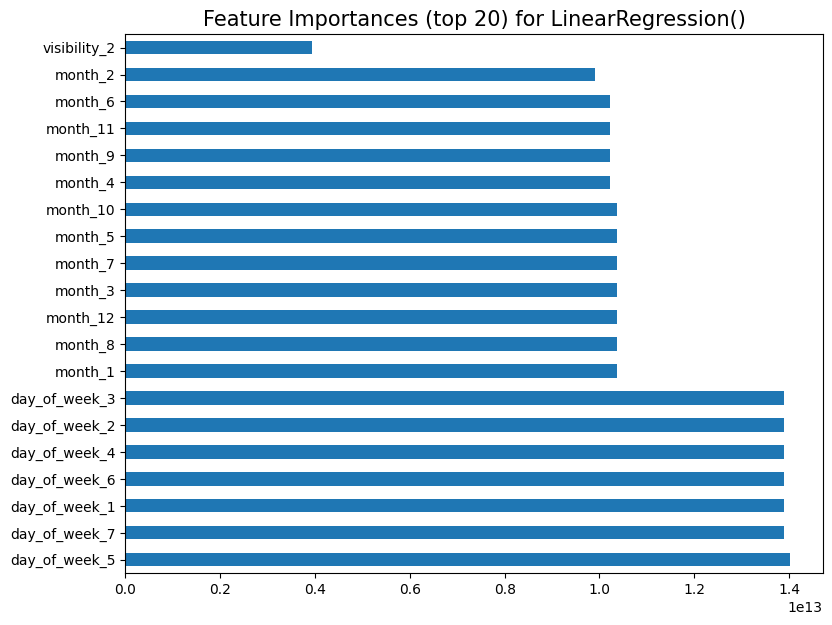

In [101]:
# Visualizing evaluation Metric Score chart
linear_score2 = evaluate_model(best_reg, y_test,y_pred_li2)

In [102]:
score['Linear regression tuned'] = linear_score2
score

,Linear regression,Linear regression tuned
MSE,88090.659090,88090.659090
RMSE,296.800706,296.800706
MAE,201.806803,201.806803
Train R2,0.784428,0.784428
Test R2,0.789520,0.789520
Adjusted R2,0.782822,0.782822


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort i have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For training data, I found R2 score of 0.784428 & 88090.659090 and 201.806803 as MSE and MAE respectively.

For testing data, I found R2 score of 0.789520 & 88090.659090 and 201.806803 as MSE and MAE respectively.

For Both training and testing data, **no improvement** is seen.

### ML Model - 2 : Lasso Regression

In [103]:
# Import the Lasso Regression class
lasso = Lasso()

# Fit the lasso regression model to your training data
lasso.fit(X_train, y_train)

# Predict on the model
y_pred_lasso1 = lasso.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 199251.13943499743
RMSE : 446.37555873389556
MAE : 303.758212165632
Train R2 : 0.5201240107717402
Test R2 : 0.5239178363804666
Adjusted R2 :  0.5087684923407172


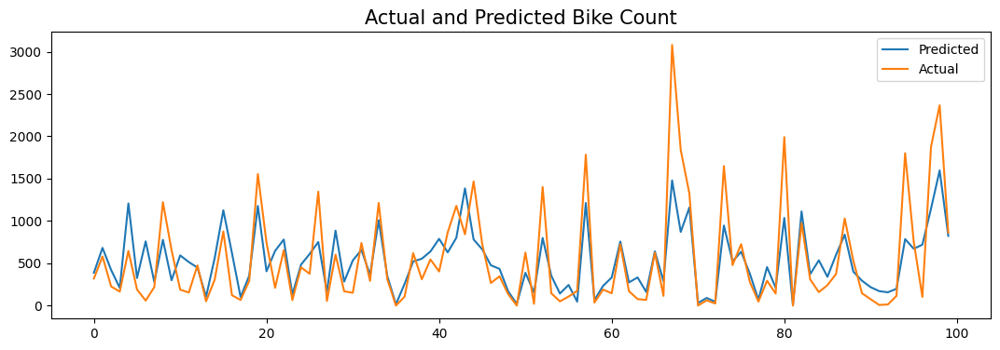

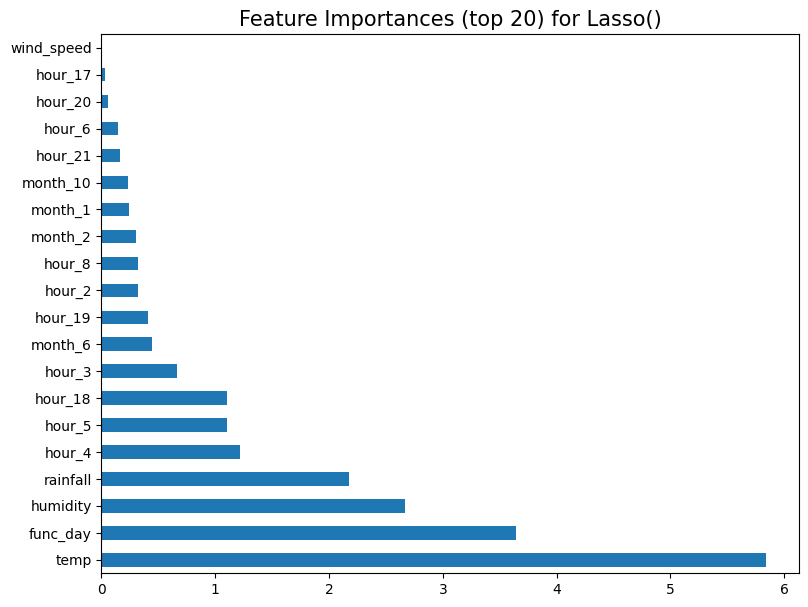

In [104]:
# Visualizing evaluation Metric Score chart
lasso_score = evaluate_model(lasso, y_test,y_pred_lasso1)
score['Lasso regression'] = lasso_score

In [105]:
score

,Linear regression,Linear regression tuned,Lasso regression
MSE,88090.659090,88090.659090,199251.139435
RMSE,296.800706,296.800706,446.375559
MAE,201.806803,201.806803,303.758212
Train R2,0.784428,0.784428,0.520124
Test R2,0.789520,0.789520,0.523918
Adjusted R2,0.782822,0.782822,0.508768


It is seen that using Lasso regression analysis the performance of the model has drop down. So i will try to tuned the model.

#### 2. Cross- Validation & Hyperparameter Tuning

In [106]:
# Define the model
lasso = Lasso()

# Define the parameters to be optimized & Perform grid search
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
lasso_regressor = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv=5)

# Fitting model
lasso_regressor.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 1e-05, 0.0001, 0.001,
                                   0.01, 1, 5, 10, 20, 30, 40, 45, 50, 55, 60,
                                   100]},
             scoring='neg_mean_squared_error')

In [107]:
# Getting optimum parameters
print("The optimum alpha value is found out to be :" ,lasso_regressor.best_params_)
print("\nUsing ",lasso_regressor.best_params_, " the negative mean squared error is: ", lasso_regressor.best_score_)

The optimum alpha value is found out to be : {'alpha': 0.0001}

Using  {'alpha': 0.0001}  the negative mean squared error is:  -30.34188545869439


In [108]:
# Import the Lasso Regression class with best alpha
lasso = Lasso(alpha = lasso_regressor.best_params_['alpha'])

# Fit the lasso regression model to your training data
lasso.fit(X_train, y_train)

# Predict the model
y_pred_lassocv = lasso.predict(X_test)

MSE : 88358.33989461442
RMSE : 297.25130764155506
MAE : 201.70425481228804
Train R2 : 0.7834759534324424
Test R2 : 0.7888803559661375
Adjusted R2 :  0.7821623472579298


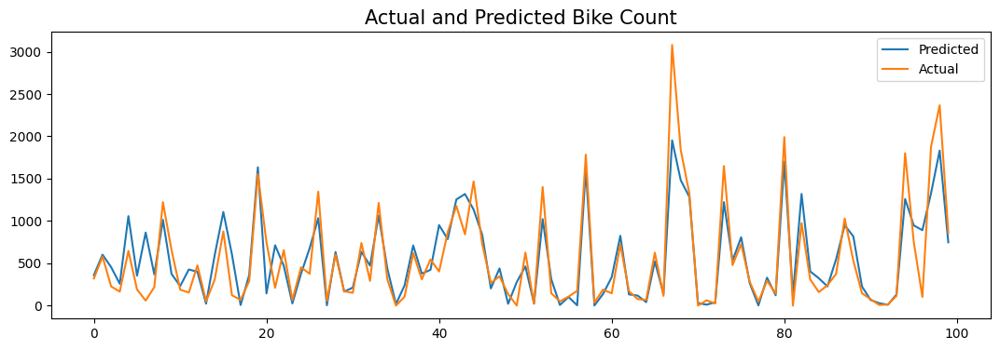

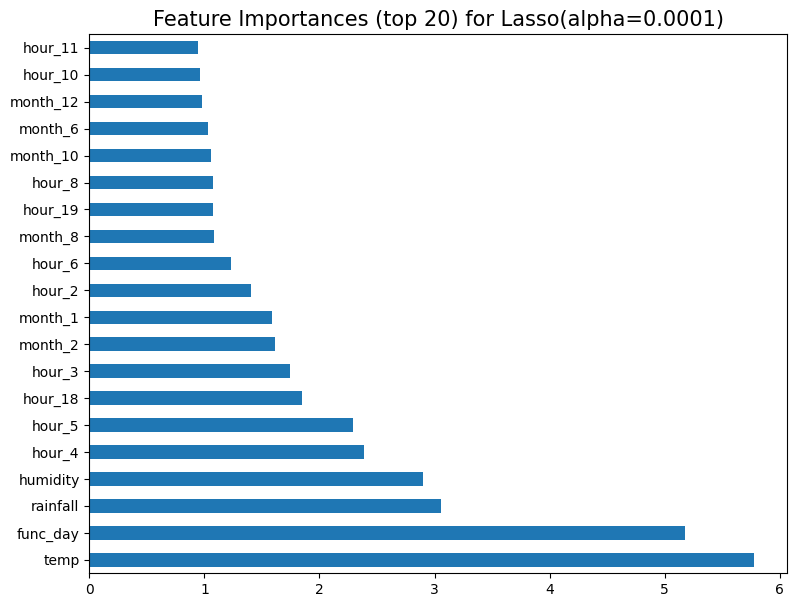

In [109]:
#Evaluation matrices for Lasso regression
lasso2 = evaluate_model(lasso, y_test,y_pred_lassocv)

name = 'Lasso with alpha = ' + str(lasso_regressor.best_params_['alpha'])

score[name] = lasso2

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort i have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [110]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001
MSE,88090.659090,88090.659090,199251.139435,88358.339895
RMSE,296.800706,296.800706,446.375559,297.251308
MAE,201.806803,201.806803,303.758212,201.704255
Train R2,0.784428,0.784428,0.520124,0.783476
Test R2,0.789520,0.789520,0.523918,0.788880
Adjusted R2,0.782822,0.782822,0.508768,0.782162


After tuning i have seen that there is increase in performance from 52% to 78%

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

RMSE & MSE are measuring the average squared values between the predicted and actual values.

Whereas R2 score is measure how well the model fits the data.

In a business context, a low RMSE and high R2 score would indicate that the model is making accurate predictions and is a good fit for the data. This would be desirable for a business because it would mean that the model is able to provide useful insights and make accurate predictions about future outcomes.

### ML Model - 3 : Ridge Regression

In [111]:
# Ridge regressor class
ridge = Ridge()

# Fit the ridge regression model to your training data
ridge.fit(X_train, y_train)

# Predict on the model
y_pred_ridge1 = ridge.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 88365.68734453894
RMSE : 297.26366637135277
MAE : 201.717161005283
Train R2 : 0.7834601310784806
Test R2 : 0.788862800283058
Adjusted R2 :  0.7821442329379108


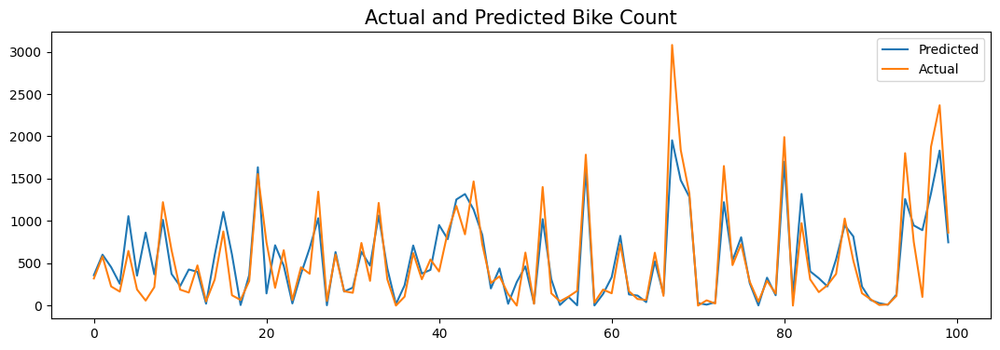

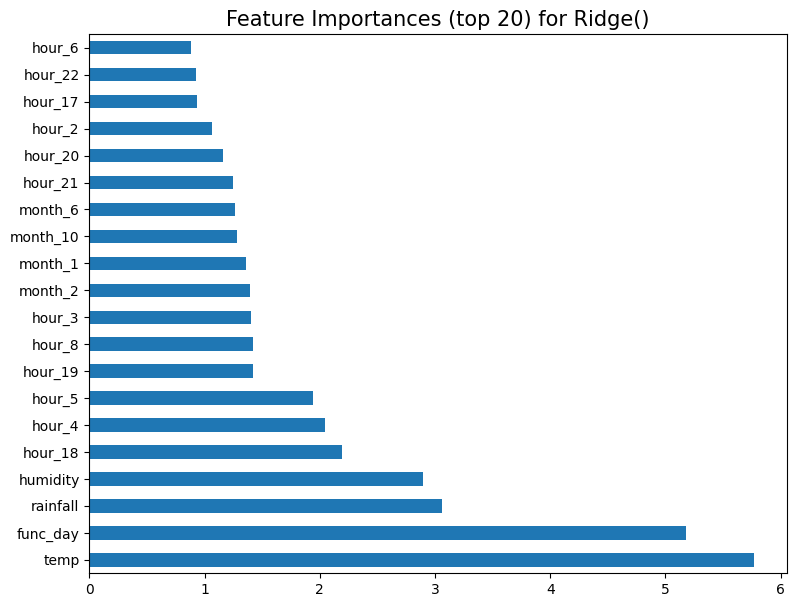

In [112]:
# Visualizing evaluation Metric Score chart
result = evaluate_model(ridge, y_test,y_pred_ridge1)
score['Ridge'] = result

In [113]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001,Ridge
MSE,88090.659090,88090.659090,199251.139435,88358.339895,88365.687345
RMSE,296.800706,296.800706,446.375559,297.251308,297.263666
MAE,201.806803,201.806803,303.758212,201.704255,201.717161
Train R2,0.784428,0.784428,0.520124,0.783476,0.783460
Test R2,0.789520,0.789520,0.523918,0.788880,0.788863
Adjusted R2,0.782822,0.782822,0.508768,0.782162,0.782144


I have used Ridge regression technique to check the performance of the model and i have found that there is no significant difference in between linear regression and Ridge.

#### 2. Cross- Validation & Hyperparameter Tuning

In [114]:
# Import Ridge regressor Class
ridge = Ridge()

# Define the parameters to be optimized & Perform grid search
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=5)

# Fitting model
ridge_regressor.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 1e-05, 0.0001, 0.001,
                                   0.01, 1, 5, 10, 20, 30, 40, 45, 50, 55, 60,
                                   100]},
             scoring='neg_mean_squared_error')

In [115]:
# Getting optimum parameters
print("The best fit alpha value is found out to be :" ,ridge_regressor.best_params_)
print("\nUsing ",ridge_regressor.best_params_, " the negative mean squared error is: ", ridge_regressor.best_score_)

The best fit alpha value is found out to be : {'alpha': 5}

Using  {'alpha': 5}  the negative mean squared error is:  -30.341486749976816


In [116]:
# Initiate ridge with best alpha
ridge = Ridge(alpha = ridge_regressor.best_params_['alpha'])

# Fit the ridge regression model to your training data
ridge.fit(X_train, y_train)

# Predict on model
y_pred_ridge = ridge.predict(X_test)

MSE : 88416.84817480511
RMSE : 297.3497068685374
MAE : 201.78332256985254
Train R2 : 0.7833529276131157
Test R2 : 0.7887405587800244
Adjusted R2 :  0.7820181016050811


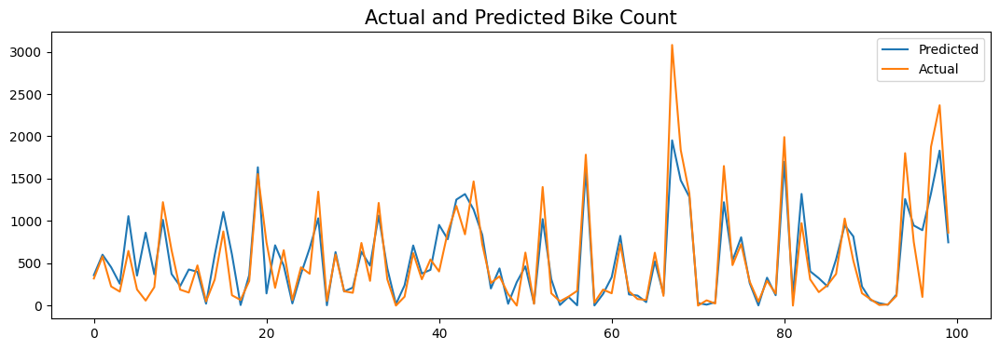

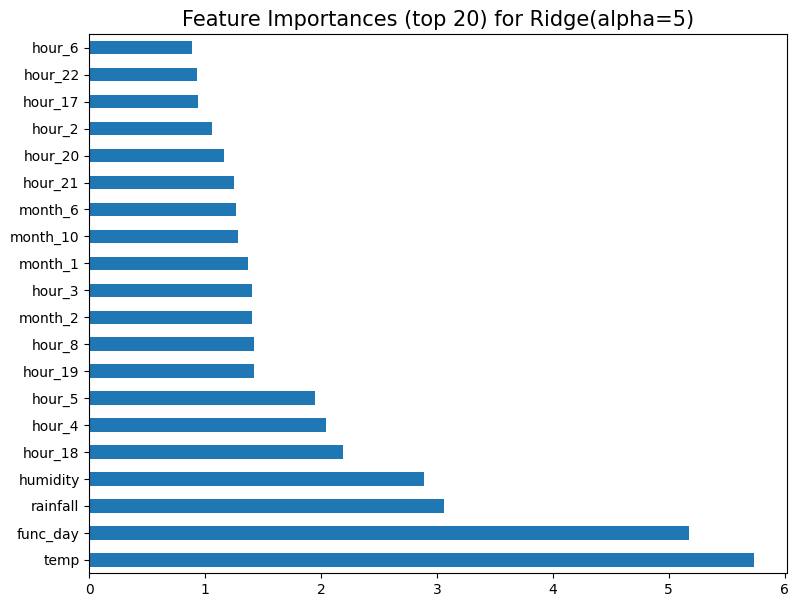

In [117]:
# Evaluation matrices for Ridge regression
result = evaluate_model(ridge, y_test,y_pred_ridge)

namer = 'Ridge with alpha = ' + str(ridge_regressor.best_params_['alpha'])

score[namer] = result

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort we have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [118]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001,Ridge,Ridge with alpha = 5
MSE,88090.659090,88090.659090,199251.139435,88358.339895,88365.687345,88416.848175
RMSE,296.800706,296.800706,446.375559,297.251308,297.263666,297.349707
MAE,201.806803,201.806803,303.758212,201.704255,201.717161,201.783323
Train R2,0.784428,0.784428,0.520124,0.783476,0.783460,0.783353
Test R2,0.789520,0.789520,0.523918,0.788880,0.788863,0.788741
Adjusted R2,0.782822,0.782822,0.508768,0.782162,0.782144,0.782018


I have tuned Ridge regression using hyperparametric technique & check the performance of the model and i have found that there is no significant difference in between tuned and without tuned.

It performs well only when there is multicollinearity or overfitting situation is present in our case we have already handle the multicollinearity situation,  thats why it is not showing any difference in performance.

### ML Model - 4 : Decision Tree

In [119]:
# Import Decision Tree Regressor class
dt = DecisionTreeRegressor(random_state=1)

# Fit the Decision Tree model to your training data
dt.fit(X_train,y_train)

# Predict on the model
y_pred_dt1 = dt.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 73491.68150684932
RMSE : 271.09349218830266
MAE : 152.0673515981735
Train R2 : 1.0
Test R2 : 0.824402114642698
Adjusted R2 :  0.8188144388564315


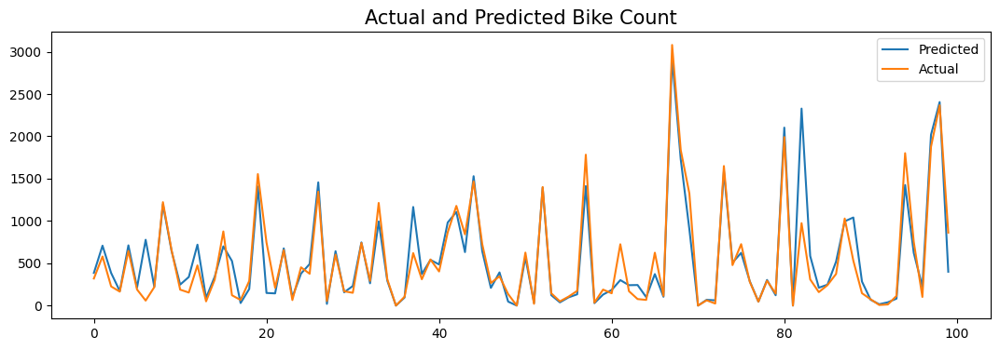

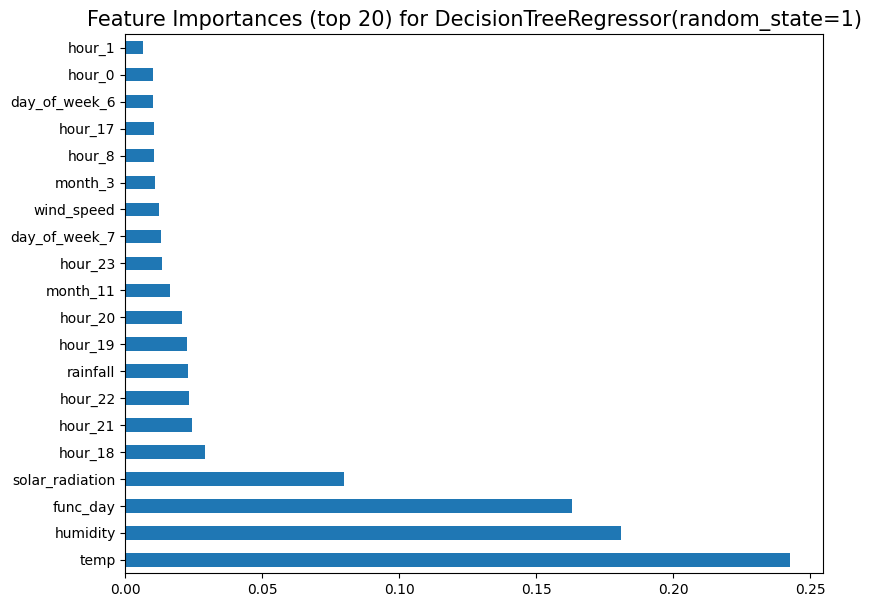

In [120]:
# Visualizing evaluation Metric Score chart
result = evaluate_model(dt, y_test,y_pred_dt1)
score['Decision tree'] = result

In [121]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001,Ridge,Ridge with alpha = 5,Decision tree
MSE,88090.659090,88090.659090,199251.139435,88358.339895,88365.687345,88416.848175,73491.681507
RMSE,296.800706,296.800706,446.375559,297.251308,297.263666,297.349707,271.093492
MAE,201.806803,201.806803,303.758212,201.704255,201.717161,201.783323,152.067352
Train R2,0.784428,0.784428,0.520124,0.783476,0.783460,0.783353,1.000000
Test R2,0.789520,0.789520,0.523918,0.788880,0.788863,0.788741,0.824402
Adjusted R2,0.782822,0.782822,0.508768,0.782162,0.782144,0.782018,0.818814


From the decision tree algorithm i got train R2 score is 100% and test R2 score is 82% which shows the overfitting condition on train dataset.

So, i have decided to tune the data using GridSearchCV.

#### 2. Cross- Validation & Hyperparameter Tuning

In [122]:
# Regressor
dt_model = DecisionTreeRegressor(random_state=1)

# Hyperparameter Grid
grid = {'max_depth' : [8,10,12,14,16],
        'min_samples_split' : np.arange(35,50),
        'min_samples_leaf' : np.arange(22,31,2)}

# Fitting model with hypertuned paramaters using grid search
dt_gridsearch = GridSearchCV(dt_model,
                             grid,
                             cv=6,
                             scoring= 'neg_root_mean_squared_error')
dt_gridsearch.fit(X_train,y_train)
dt_best_params = dt_gridsearch.best_params_

In [123]:
dt_best_params

{'max_depth': 16, 'min_samples_leaf': 22, 'min_samples_split': 35}

In [124]:
# Building Decision Tree model with best parameters
dt_model = DecisionTreeRegressor(max_depth=dt_best_params['max_depth'],
                                 min_samples_leaf=dt_best_params['min_samples_leaf'],
                                 min_samples_split=dt_best_params['min_samples_split'],
                                 random_state=1)

In [125]:
# Fitting model
dt_model.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=16, min_samples_leaf=22, min_samples_split=35,
                      random_state=1)

In [126]:
# Predict on the model
y_pred_dt = dt_model.predict(X_test)

MSE : 89557.65707345174
RMSE : 299.2618536891258
MAE : 184.41649011155485
Train R2 : 0.8375934856837123
Test R2 : 0.7860147587154215
Adjusted R2 :  0.7792055642373029


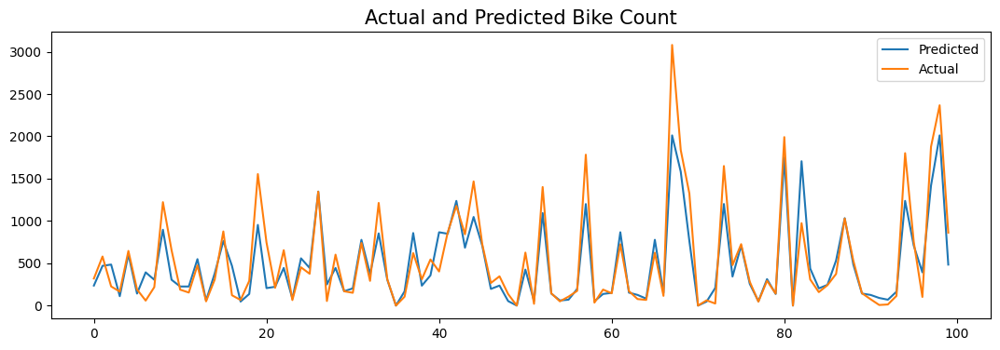

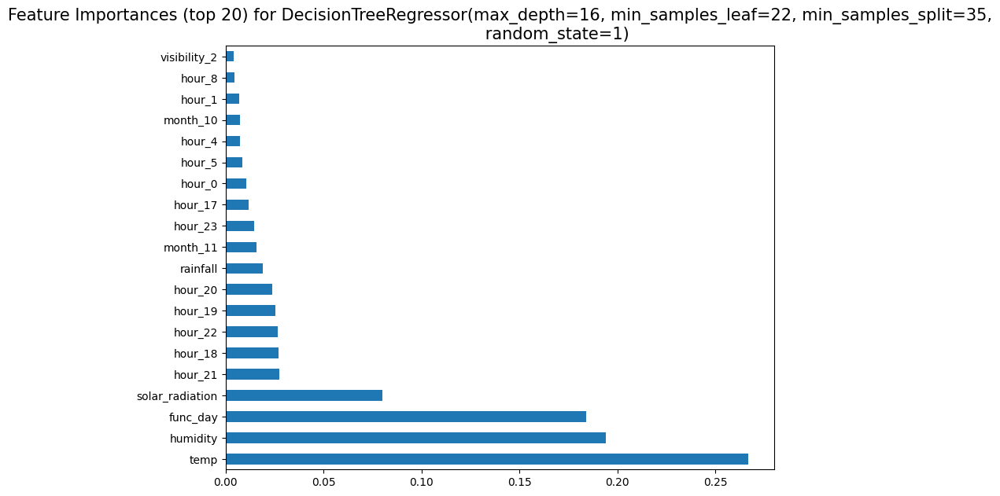

In [127]:
# Evaluation matrices for DecisionTree
result = evaluate_model(dt_model, y_test,y_pred_dt)
score['Decision tree tuned'] = result

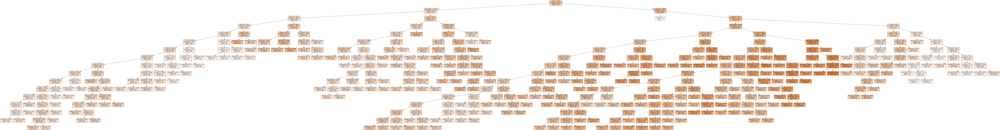

In [128]:
# Decision tree diagram
graph = Source(tree.export_graphviz(dt_model,
                                    out_file=None,
                                    feature_names=features,
                                    filled= True))
display(SVG(graph.pipe(format='svg')))

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort we have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [129]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned
MSE,88090.659090,88090.659090,199251.139435,88358.339895,88365.687345,88416.848175,73491.681507,89557.657073
RMSE,296.800706,296.800706,446.375559,297.251308,297.263666,297.349707,271.093492,299.261854
MAE,201.806803,201.806803,303.758212,201.704255,201.717161,201.783323,152.067352,184.416490
Train R2,0.784428,0.784428,0.520124,0.783476,0.783460,0.783353,1.000000,0.837593
Test R2,0.789520,0.789520,0.523918,0.788880,0.788863,0.788741,0.824402,0.786015
Adjusted R2,0.782822,0.782822,0.508768,0.782162,0.782144,0.782018,0.818814,0.779206


From the above tuned Decision tree regression, it has seen that earlier that we have faced overfitting condition. After tuning it there is no such condition and it looks like model performs with good accuracy around 83% on train and 78% on test data.

### ML Model - 5 : Random Forest

In [130]:
# Import Random Forest Regressor class
rf = RandomForestRegressor(random_state=0)

# Fit the Random Forest model to your training data
rf.fit(X_train,y_train)

# Predict on the model
y_pred_rf1 = rf.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 38747.939048529646
RMSE : 196.8449619587193
MAE : 112.34713100325216
Train R2 : 0.9881686099987611
Test R2 : 0.9074173291538947
Adjusted R2 :  0.9044712689148319


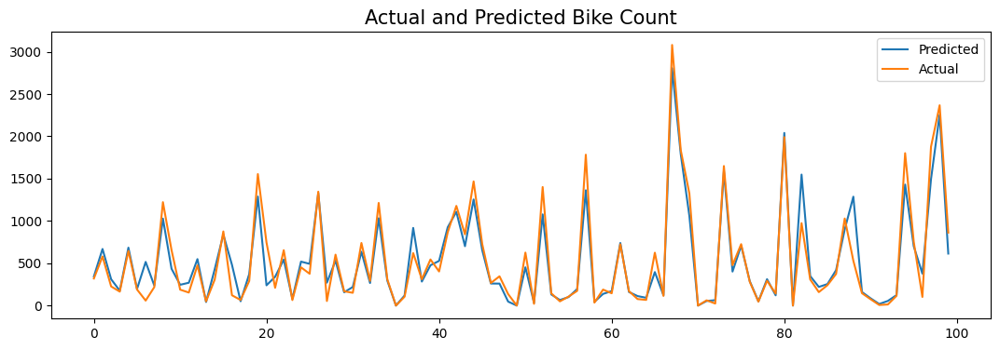

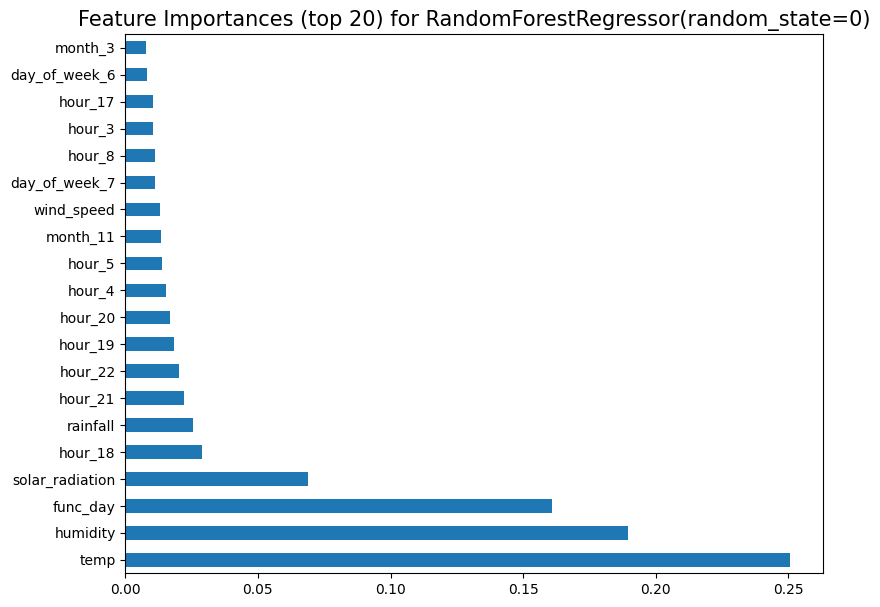

In [131]:
# Visualizing evaluation Metric Score chart
result = evaluate_model(rf, y_test,y_pred_rf1)
score['Random forest'] = result

In [132]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest
MSE,88090.659090,88090.659090,199251.139435,88358.339895,88365.687345,88416.848175,73491.681507,89557.657073,38747.939049
RMSE,296.800706,296.800706,446.375559,297.251308,297.263666,297.349707,271.093492,299.261854,196.844962
MAE,201.806803,201.806803,303.758212,201.704255,201.717161,201.783323,152.067352,184.416490,112.347131
Train R2,0.784428,0.784428,0.520124,0.783476,0.783460,0.783353,1.000000,0.837593,0.988169
Test R2,0.789520,0.789520,0.523918,0.788880,0.788863,0.788741,0.824402,0.786015,0.907417
Adjusted R2,0.782822,0.782822,0.508768,0.782162,0.782144,0.782018,0.818814,0.779206,0.904471


Here i have seen that using random forest, regression accuracy of the train and test model increases 98% and 90% respectively, which seems to be a good model for prediction.

#### 2. Cross- Validation & Hyperparameter Tuning

In [133]:
# Random forest model
rf_model = RandomForestRegressor(random_state=0)
rf_params = {'n_estimators':[300],                    # limited due to computational power availability
             'min_samples_leaf':np.arange(20,25)}     # Approximate range from a decision tree model

In [134]:
# Fitting a Random Forest model with best parameters obtained from gridsearch
rf_gridsearch = GridSearchCV(rf_model,rf_params,cv=6,scoring='neg_root_mean_squared_error')
rf_gridsearch.fit(X_train,y_train)
rf_best_params = rf_gridsearch.best_params_

In [135]:
# Best parameters for random forests
rf_best_params

{'min_samples_leaf': 20, 'n_estimators': 300}

In [136]:
# Building Random Forest model with best parameters
rf_model = RandomForestRegressor(n_estimators=rf_best_params['n_estimators'],
                                 min_samples_leaf=rf_best_params['min_samples_leaf'],
                                 random_state=0)

In [137]:
# Fitting model
rf_model.fit(X_train,y_train)

RandomForestRegressor(min_samples_leaf=20, n_estimators=300, random_state=0)

In [138]:
# Predict on the model
y_pred_rf = rf_model.predict(X_test)

MSE : 75962.32375859405
RMSE : 275.6126335250147
MAE : 166.3139028404189
Train R2 : 0.8558829868398841
Test R2 : 0.8184988675542456
Adjusted R2 :  0.8127233453668145


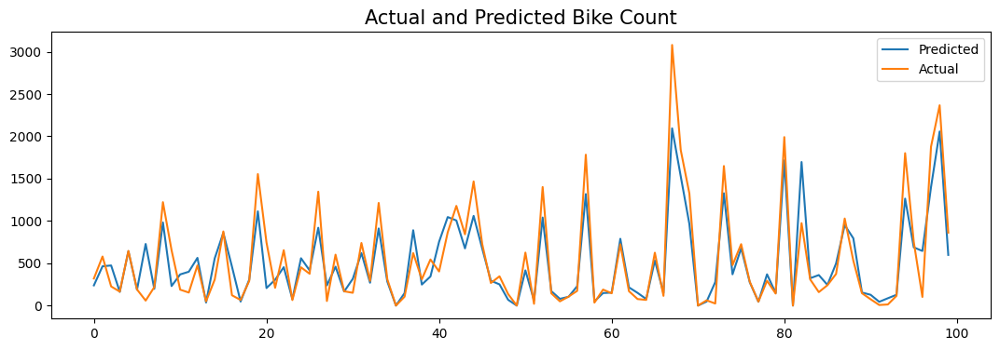

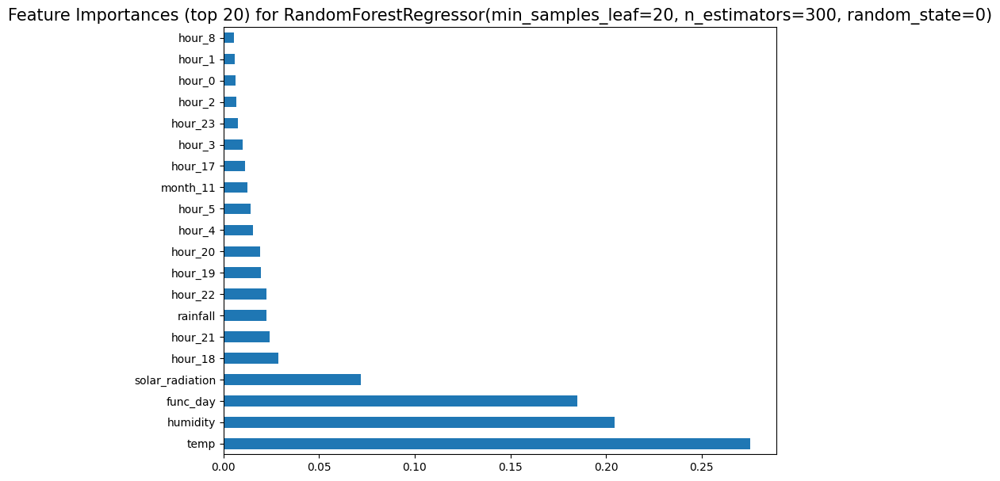

In [139]:
# Evaluation matrices for RandomForest
result = evaluate_model(rf_model, y_test,y_pred_rf)
score['Random forest tuned'] = result

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort we have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [140]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest,Random forest tuned
MSE,88090.659090,88090.659090,199251.139435,88358.339895,88365.687345,88416.848175,73491.681507,89557.657073,38747.939049,75962.323759
RMSE,296.800706,296.800706,446.375559,297.251308,297.263666,297.349707,271.093492,299.261854,196.844962,275.612634
MAE,201.806803,201.806803,303.758212,201.704255,201.717161,201.783323,152.067352,184.416490,112.347131,166.313903
Train R2,0.784428,0.784428,0.520124,0.783476,0.783460,0.783353,1.000000,0.837593,0.988169,0.855883
Test R2,0.789520,0.789520,0.523918,0.788880,0.788863,0.788741,0.824402,0.786015,0.907417,0.818499
Adjusted R2,0.782822,0.782822,0.508768,0.782162,0.782144,0.782018,0.818814,0.779206,0.904471,0.812723


After tuning the random forest algorithm it has seen that there is drop in performance both in train and test score so i am not going to use this model.

### ML Model - 6 : Gradient Boosting Regressor

In [141]:
# Import Gradient Boosting Regressor class
gb = GradientBoostingRegressor(random_state=0)

# Fit the Gradient Boosting model to the training data
gb.fit(X_train,y_train)

# Predict on the model
y_pred_gb1 = gb.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 77975.24920161186
RMSE : 279.2404863224741
MAE : 186.13005739507054
Train R2 : 0.8258252767878081
Test R2 : 0.8136892694619378
Adjusted R2 :  0.8077607017253112


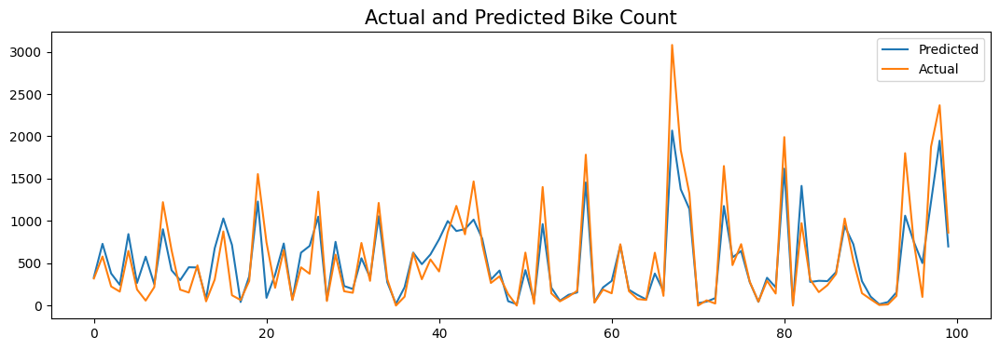

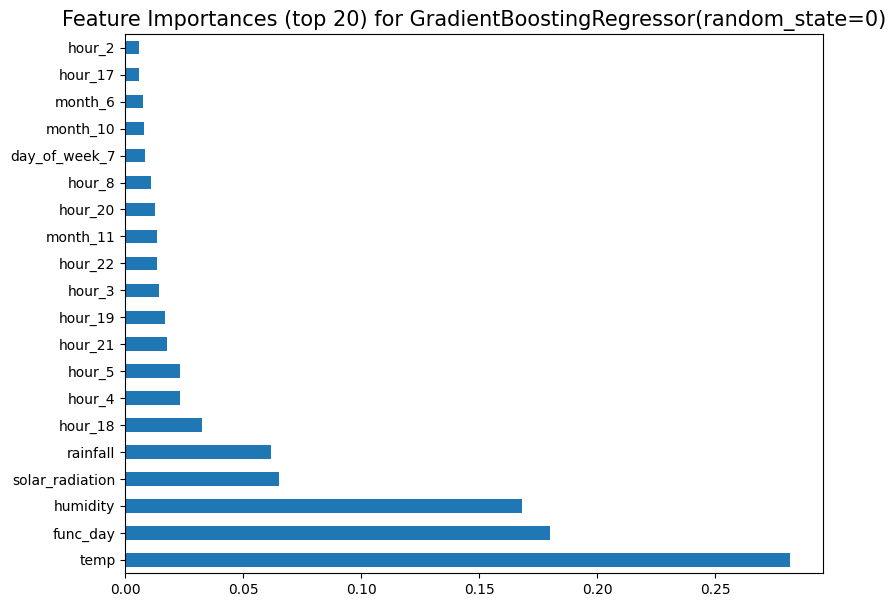

In [142]:
# Visualizing evaluation Metric Score chart
result = evaluate_model(gb, y_test,y_pred_gb1)
score['Gradient Boosting Regressor'] = result

In [143]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest,Random forest tuned,Gradient Boosting Regressor
MSE,88090.659090,88090.659090,199251.139435,88358.339895,88365.687345,88416.848175,73491.681507,89557.657073,38747.939049,75962.323759,77975.249202
RMSE,296.800706,296.800706,446.375559,297.251308,297.263666,297.349707,271.093492,299.261854,196.844962,275.612634,279.240486
MAE,201.806803,201.806803,303.758212,201.704255,201.717161,201.783323,152.067352,184.416490,112.347131,166.313903,186.130057
Train R2,0.784428,0.784428,0.520124,0.783476,0.783460,0.783353,1.000000,0.837593,0.988169,0.855883,0.825825
Test R2,0.789520,0.789520,0.523918,0.788880,0.788863,0.788741,0.824402,0.786015,0.907417,0.818499,0.813689
Adjusted R2,0.782822,0.782822,0.508768,0.782162,0.782144,0.782018,0.818814,0.779206,0.904471,0.812723,0.807761


Using Gradient Boosting Regressor i have got low accuracy around 82% and 81% on train and test data respectively, which is less than random forest.

So, lets tune it.

#### 2. Cross- Validation & Hyperparameter Tuning

In [144]:
# Gradient Boosting Model
gb_model = GradientBoostingRegressor(random_state=0)
gb_params = {'n_estimators':[300],
             'min_samples_leaf':np.arange(20,24),
             'max_depth':np.arange(14,17)
             }

In [146]:
# Perform the randomized search
random_search = RandomizedSearchCV(gb_model, param_distributions=gb_params, cv=6, n_iter=20, scoring='neg_root_mean_squared_error', n_jobs=-1)
random_search.fit(X_train, y_train)

gb_best_params = random_search.best_params_

In [147]:
# Best parameters for Gradient Boosting Model
gb_best_params

{'n_estimators': 300, 'min_samples_leaf': 22, 'max_depth': 15}

In [148]:
# Building Gradient Boosting Model with best parameters
gb_model = GradientBoostingRegressor(n_estimators=gb_best_params['n_estimators'],
                                     min_samples_leaf=gb_best_params['min_samples_leaf'],
                                     max_depth = gb_best_params['max_depth'],
                                     random_state=0)

In [149]:
# Fitting model
gb_model.fit(X_train,y_train)

GradientBoostingRegressor(max_depth=15, min_samples_leaf=22, n_estimators=300,
                          random_state=0)

In [150]:
# Predict on the Model
y_pred_gb = gb_model.predict(X_test)

MSE : 28399.67260989422
RMSE : 168.52202410929624
MAE : 97.43931235582568
Train R2 : 0.99476509675711
Test R2 : 0.9321430350634672
Adjusted R2 :  0.9299837680590047


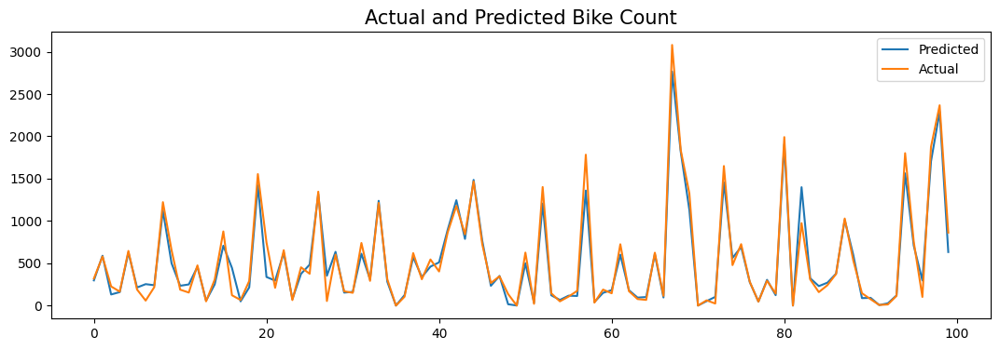

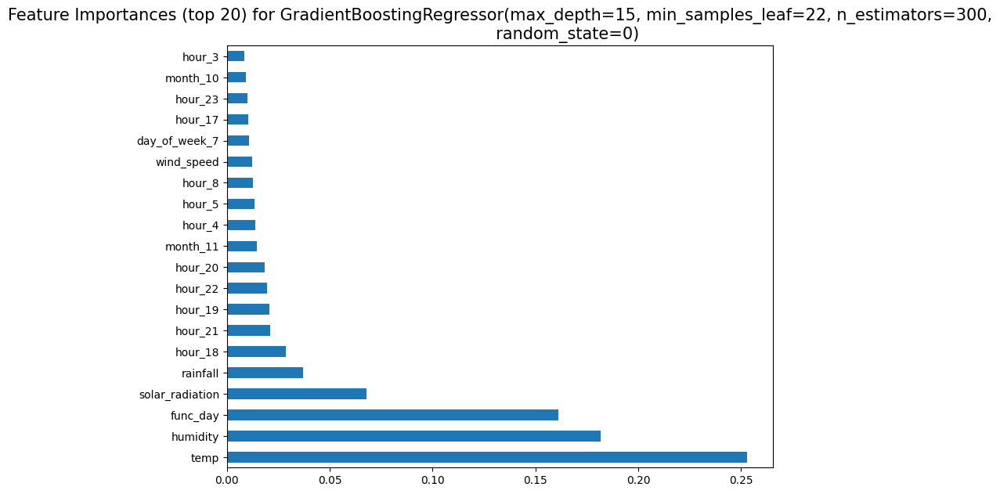

In [151]:
# Evaluation matrices for GradientBoosting
result = evaluate_model(gb_model, y_test,y_pred_gb)
score['Gradient Boosting Regressor Tuned'] = result

##### Which hyperparameter optimization technique have you used and why?

Randomized search cross-validation (CV) is used to efficiently explore the hyperparameter space of a machine learning model. It works by randomly sampling from the search space of hyperparameters, rather than exhaustively trying every possible combination. This allows for a more efficient search while still providing a good chance of finding good hyperparameter values. Additionally, by using cross-validation to evaluate the performance of each set of hyperparameters, one can ensure that the model is not overfitting to the training data.

Because of its randomly sampling technique and to save the time i have decided to use Randomized search CV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [152]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest,Random forest tuned,Gradient Boosting Regressor,Gradient Boosting Regressor Tuned
MSE,88090.659090,88090.659090,199251.139435,88358.339895,88365.687345,88416.848175,73491.681507,89557.657073,38747.939049,75962.323759,77975.249202,28399.672610
RMSE,296.800706,296.800706,446.375559,297.251308,297.263666,297.349707,271.093492,299.261854,196.844962,275.612634,279.240486,168.522024
MAE,201.806803,201.806803,303.758212,201.704255,201.717161,201.783323,152.067352,184.416490,112.347131,166.313903,186.130057,97.439312
Train R2,0.784428,0.784428,0.520124,0.783476,0.783460,0.783353,1.000000,0.837593,0.988169,0.855883,0.825825,0.994765
Test R2,0.789520,0.789520,0.523918,0.788880,0.788863,0.788741,0.824402,0.786015,0.907417,0.818499,0.813689,0.932143
Adjusted R2,0.782822,0.782822,0.508768,0.782162,0.782144,0.782018,0.818814,0.779206,0.904471,0.812723,0.807761,0.929984


After using the Randomised search CV, the model performs very well it gave accuracy 99% on train data & 93% on test data which is very good model accuracy. But it is overfitting the model's training accuracy is almost 100%.

### ML Model - 7 : Extreme Gradient Boosting Regressor

In [153]:
# Import Extreme Gradient Boosting Regressor class
xgb_model = xgb.XGBRegressor(random_state=0,
                             objective='reg:squarederror')

# Fit the Extreme Gradient Boosting model to the training data
xgb_model.fit(X_train,y_train)

# Predict on the model
y_pred_xgb1 = xgb_model.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 29711.779490691682
RMSE : 172.37105177694914
MAE : 103.3793908457598
Train R2 : 0.9795230294730498
Test R2 : 0.9290079429155302
Adjusted R2 :  0.9267489145816696


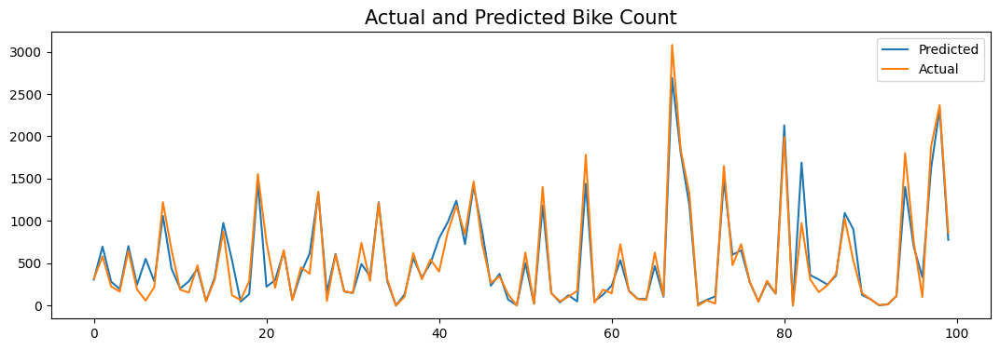

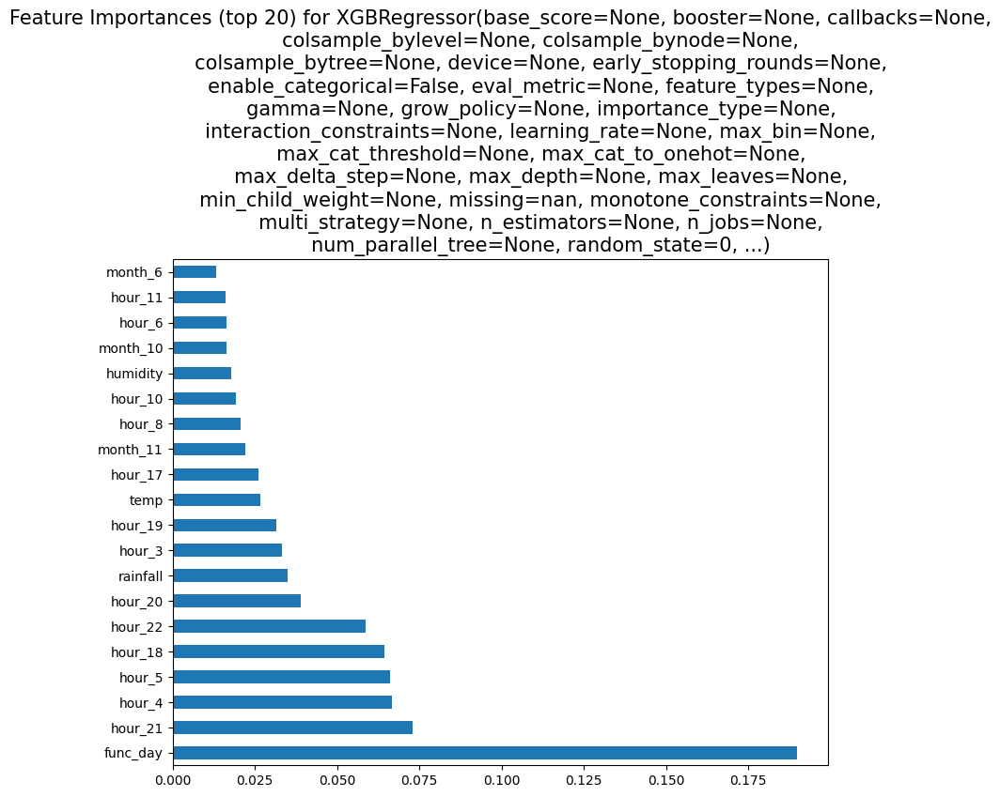

In [154]:
# Visualizing evaluation Metric Score chart
result = evaluate_model(xgb_model, y_test,y_pred_xgb1)
score['Extreme Gradient Boosting Regressor'] = result

In [156]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest,Random forest tuned,Gradient Boosting Regressor,Gradient Boosting Regressor Tuned,Extreme Gradient Boosting Regressor
MSE,88090.659090,88090.659090,199251.139435,88358.339895,88365.687345,88416.848175,73491.681507,89557.657073,38747.939049,75962.323759,77975.249202,28399.672610,29711.779491
RMSE,296.800706,296.800706,446.375559,297.251308,297.263666,297.349707,271.093492,299.261854,196.844962,275.612634,279.240486,168.522024,172.371052
MAE,201.806803,201.806803,303.758212,201.704255,201.717161,201.783323,152.067352,184.416490,112.347131,166.313903,186.130057,97.439312,103.379391
Train R2,0.784428,0.784428,0.520124,0.783476,0.783460,0.783353,1.000000,0.837593,0.988169,0.855883,0.825825,0.994765,0.979523
Test R2,0.789520,0.789520,0.523918,0.788880,0.788863,0.788741,0.824402,0.786015,0.907417,0.818499,0.813689,0.932143,0.929008
Adjusted R2,0.782822,0.782822,0.508768,0.782162,0.782144,0.782018,0.818814,0.779206,0.904471,0.812723,0.807761,0.929984,0.926749


Using Extreme Gradient Boosting Regressor i have got accuracy around 97% and 92% on train and test data respectively, which is very good till now, than others algorithm.


#### 2. Cross- Validation & Hyperparameter Tuning

In [157]:
# XG boost model
xgb_model = xgb.XGBRegressor(random_state=0,
                             objective='reg:squarederror')
xgb_params = {'n_estimators':[500],
             'min_samples_leaf':np.arange(20,22)}

In [158]:
# Perform the randomized search
xgb_search = RandomizedSearchCV(xgb_model,xgb_params,cv=6,scoring='neg_root_mean_squared_error',n_iter=100, n_jobs=-1)
xgb_search.fit(X_train,y_train)
xgb_best_params = xgb_search.best_params_

In [159]:
# Best parameters for XG boost Model
xgb_best_params

{'n_estimators': 500, 'min_samples_leaf': 20}

In [160]:
# Building a XG boost model with best parameters
xgb_model = xgb.XGBRegressor(n_estimators=xgb_best_params['n_estimators'],
                             min_samples_leaf=xgb_best_params['min_samples_leaf'],
                             random_state=0)

In [161]:
# Fitting model
xgb_model.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, min_samples_leaf=20, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=None, num_parallel_tree=None, ...)

In [162]:
# Predict on the model
y_pred_xgb = xgb_model.predict(X_test)

MSE : 26298.05495973457
RMSE : 162.16675047535043
MAE : 95.88500567134598
Train R2 : 0.9993853485951172
Test R2 : 0.9371645505279517
Adjusted R2 :  0.9351650724657887


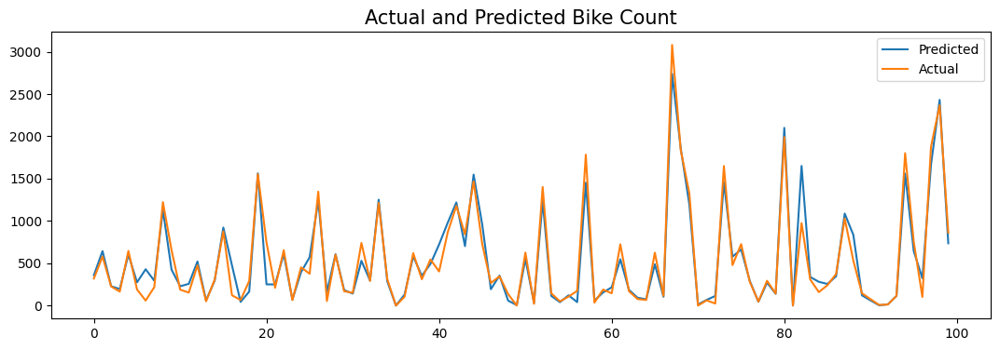

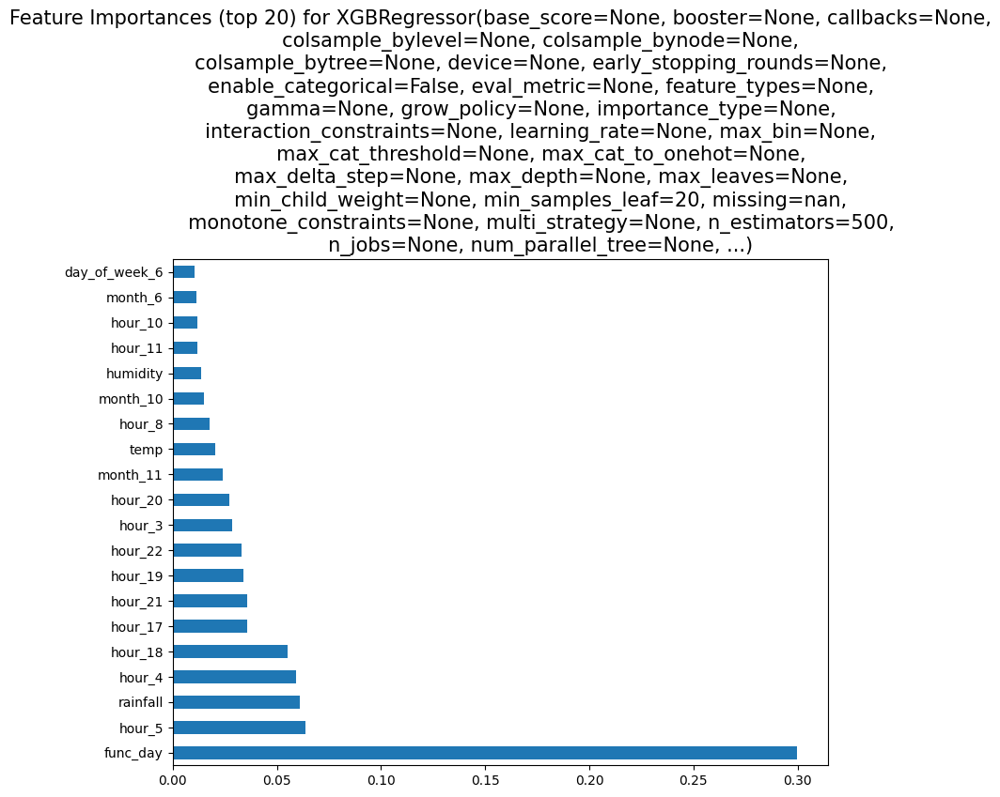

In [163]:
# Evaluation matrices for XGBRegressor
result = evaluate_model(xgb_model, y_test,y_pred_xgb)
score['Extreme Gradient Boosting Regressor Tuned'] = result

##### Which hyperparameter optimization technique have you used and why?

Randomized search cross-validation (CV) is used to efficiently explore the hyperparameter space of a machine learning model. It works by randomly sampling from the search space of hyperparameters, rather than exhaustively trying every possible combination. This allows for a more efficient search while still providing a good chance of finding good hyperparameter values. Additionally, by using cross-validation to evaluate the performance of each set of hyperparameters, one can ensure that the model is not overfitting to the training data.

Because of its randomly sampling technique and to save the time i have decided to use Randomized search CV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [164]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.0001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest,Random forest tuned,Gradient Boosting Regressor,Gradient Boosting Regressor Tuned,Extreme Gradient Boosting Regressor,Extreme Gradient Boosting Regressor Tuned
MSE,88090.659090,88090.659090,199251.139435,88358.339895,88365.687345,88416.848175,73491.681507,89557.657073,38747.939049,75962.323759,77975.249202,28399.672610,29711.779491,26298.054960
RMSE,296.800706,296.800706,446.375559,297.251308,297.263666,297.349707,271.093492,299.261854,196.844962,275.612634,279.240486,168.522024,172.371052,162.166750
MAE,201.806803,201.806803,303.758212,201.704255,201.717161,201.783323,152.067352,184.416490,112.347131,166.313903,186.130057,97.439312,103.379391,95.885006
Train R2,0.784428,0.784428,0.520124,0.783476,0.783460,0.783353,1.000000,0.837593,0.988169,0.855883,0.825825,0.994765,0.979523,0.999385
Test R2,0.789520,0.789520,0.523918,0.788880,0.788863,0.788741,0.824402,0.786015,0.907417,0.818499,0.813689,0.932143,0.929008,0.937165
Adjusted R2,0.782822,0.782822,0.508768,0.782162,0.782144,0.782018,0.818814,0.779206,0.904471,0.812723,0.807761,0.929984,0.926749,0.935165


After tuning the model i have got accuracy on train data arround 99 % and 93% on test data which is very good model accuracy, like Gradient Boosting Tuning data. But it is overfitting the model's training accuracy is almost 100%.

So, i would like to go with the model accuracy data of XGboost, before tuning. Which is 97% on train data and 92% on test data.

### Plot R1/R2 scores for each model

In [165]:
score.columns

Index(['Linear regression', 'Linear regression tuned', 'Lasso regression',
       'Lasso with alpha = 0.0001', 'Ridge', 'Ridge with alpha = 5',
       'Decision tree', 'Decision tree tuned', 'Random forest',
       'Random forest tuned', 'Gradient Boosting Regressor',
       'Gradient Boosting Regressor Tuned',
       'Extreme Gradient Boosting Regressor',
       'Extreme Gradient Boosting Regressor Tuned'],
      dtype='object')

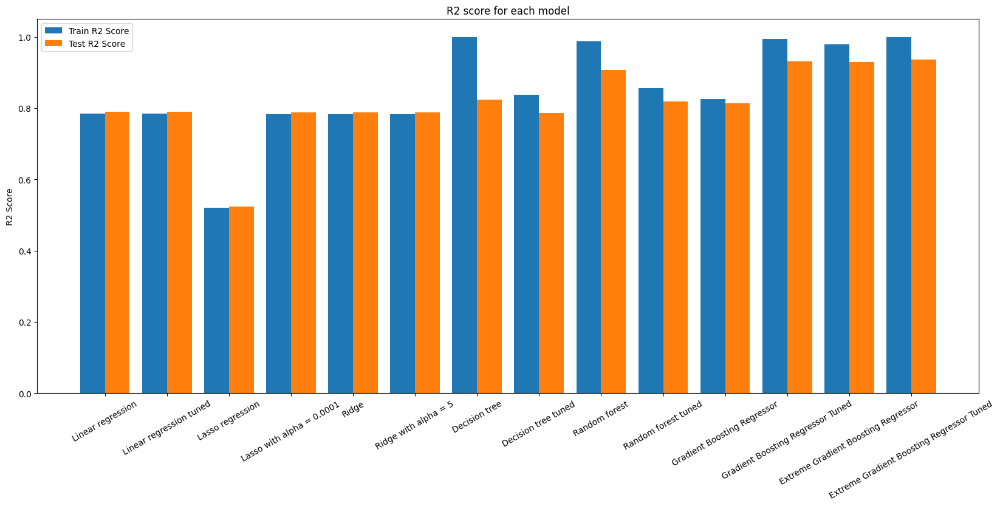

In [166]:
# R2 Scores plot

models = list(score.columns)
train = score.iloc[-3,:]
test = score.iloc[-2,:]

X_axis = np.arange(len(models))

plt.figure(figsize=(20,8))
plt.bar(X_axis - 0.2, train, 0.4, label = 'Train R2 Score')
plt.bar(X_axis + 0.2, test, 0.4, label = 'Test R2 Score')


plt.xticks(X_axis,models, rotation=30)
plt.ylabel("R2 Score")
plt.title("R2 score for each model")
plt.legend()
plt.show()

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

On the basis of all the model i have decided to select R2 score Evaluation matrics which shows the accuracy of the model which is very good indicator to check the feasibility of the model.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

I have ran a several models like linear regression, decision tree, random forest, gradient boosting, and extreme gradient boosting but amongst them i have selected extreme gradient boosting regressor as i achieved 97% training accuracy and 92% testing accuracy.

## ***8.*** ***Future Work (Optional)***

# **Conclusion**

The project successfully demonstrated the feasibility of using machine learning techniques to predict bike demand in Seoul.

Some of the key points are:-

*   High demand in the morning and evening.
*   Less Demand in the winter season.
*   Highest demand in june.
*   Found multicollinearity between temperature and dew point temperature.
*   Perform linear regression, decision tree, random forest, gradient boosting, Extreme gradient boosting. & got highest accuracy i.e ***97% on train and 92% on test*** on ***Xtreme gradient boosting***.
*   There is no use of removing outliers, it affects negatively on model performance.

Overall, the project highlights the potential of machine learning in solving real-world problems and provides a roadmap for future research in this area. The findings of this project can be extended to other cities with similar bike sharing systems, leading to more effective and efficient bike sharing operations, and better outcomes for all stakeholders.


### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***